In [1]:
import os
import shutil
import tempfile
import matplotlib.pyplot as plt
import PIL
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.tensorboard import SummaryWriter
import numpy as np
import sklearn

In [2]:
def load_images(path, labels):
  image_files = []
  labels_return = []
  for label in labels:
    for file in os.listdir(os.path.join(path, label)):
      image_files.append(os.path.join(path) + "/" + label + "/" + file)
      labels_return.append(label)
  return image_files, labels_return

class Dataset(torch.utils.data.Dataset):
    def __init__(self, image_files, labels, transforms):
        self.image_files = image_files
        self.labels = labels
        self.transforms = transforms
    def __len__(self):
        return len(self.image_files)
    def __getitem__(self, index):
        return self.transforms(self.image_files[index]), self.labels[index]

In [3]:
path = "/home/melidia/.cache/kagglehub/datasets/sartajbhuvaji/brain-tumor-classification-mri/versions/2"
list_labels = ["glioma_tumor", "meningioma_tumor", "no_tumor", "pituitary_tumor"]

images_train, label_train = load_images(path + "/Training", list_labels)
images_test, label_test = load_images(path + "/Testing", list_labels)


In [4]:
label_to_index = {
        'no_tumor': 0,
        'pituitary_tumor': 1,
        'meningioma_tumor': 2,
        'glioma_tumor': 3
    }
label_train = [label_to_index[label] for label in label_train]
label_test = [label_to_index[label] for label in label_test]

In [5]:
def split_train_val(images_train, label_train, val, train):
    val_frac = val #0.2
    train_frac = train #0.8
    length = len(images_train)
    train_length = int(train_frac * length)
    indices = np.arange(length)
    np.random.shuffle(indices)

    val_split = int(val_frac * length)
    val_indices = indices[:val_split]
    train_indices = indices[val_split:train_length]
    train_x = [images_train[i] for i in train_indices]
    val_x = [images_train[i] for i in val_indices]

    train_y = [label_train[i] for i in train_indices]
    val_y = [label_train[i] for i in val_indices]

    return train_x, val_x, train_y, val_y

In [6]:
train_x, val_x, train_y, val_y = split_train_val(images_train, label_train, 0.2, 0.8)

In [7]:
list_labels = [0, 1, 2, 3]
label_counts_train = [label_train.count(label) for label in list_labels]
# print(label_counts_train)

label_counts_test = [label_test.count(label) for label in list_labels]
print(label_counts_test)

[105, 74, 115, 100]


<Axes: >

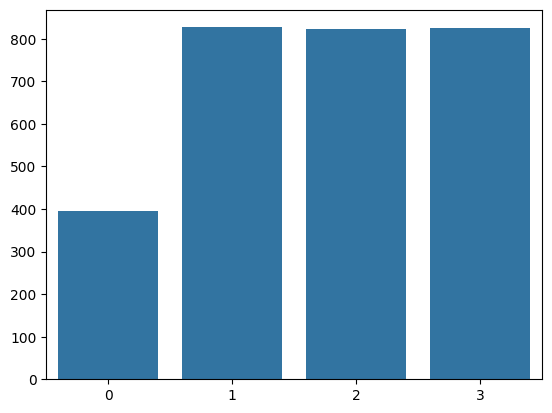

In [8]:
import seaborn as sns
sns.barplot(x=list_labels, y=label_counts_train)

<Axes: >

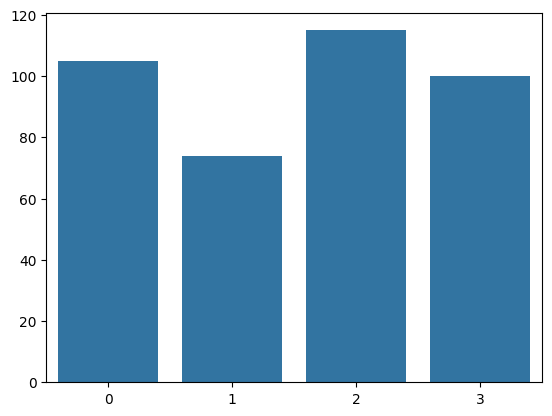

In [9]:
sns.barplot(x=list_labels, y=label_counts_test)

In [10]:
import random
def show_images(images, labels):
    for i in range(10):
        plt.figure(figsize=(10,10))
        index = random.randint(0, len(labels) - 1)
        image = PIL.Image.open(images[index])
        plt.imshow(image)
        plt.title(f"Label: {labels[index]}")
        plt.show()

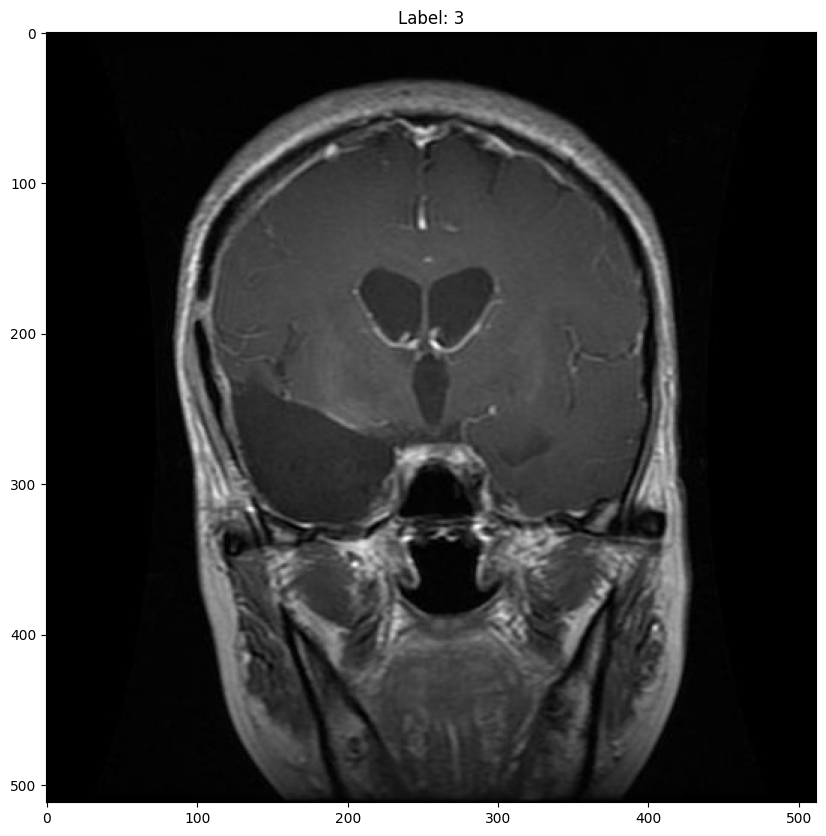

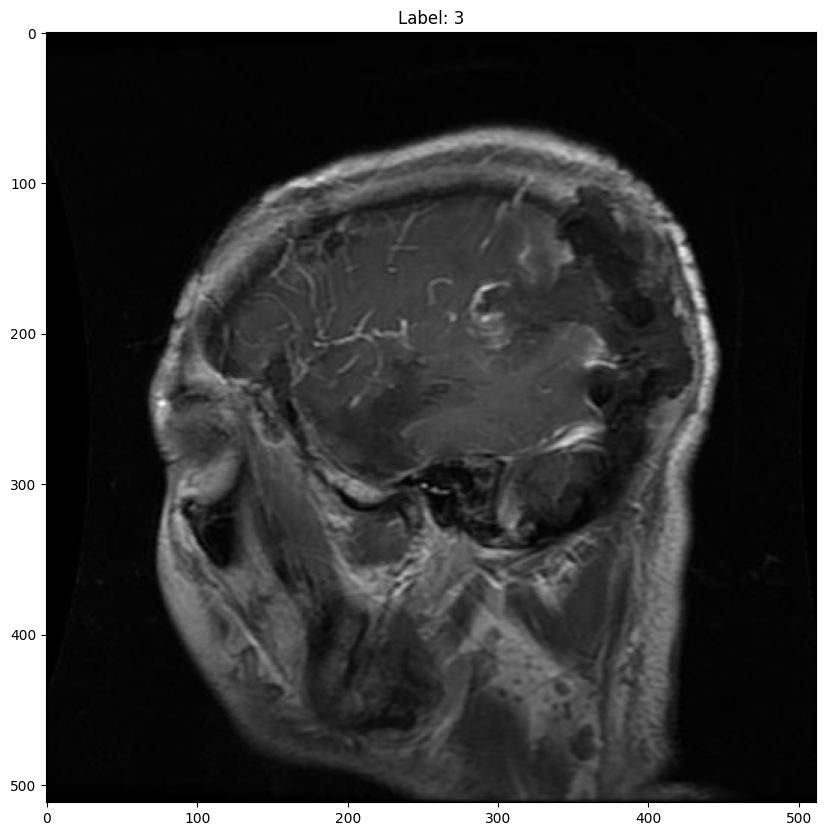

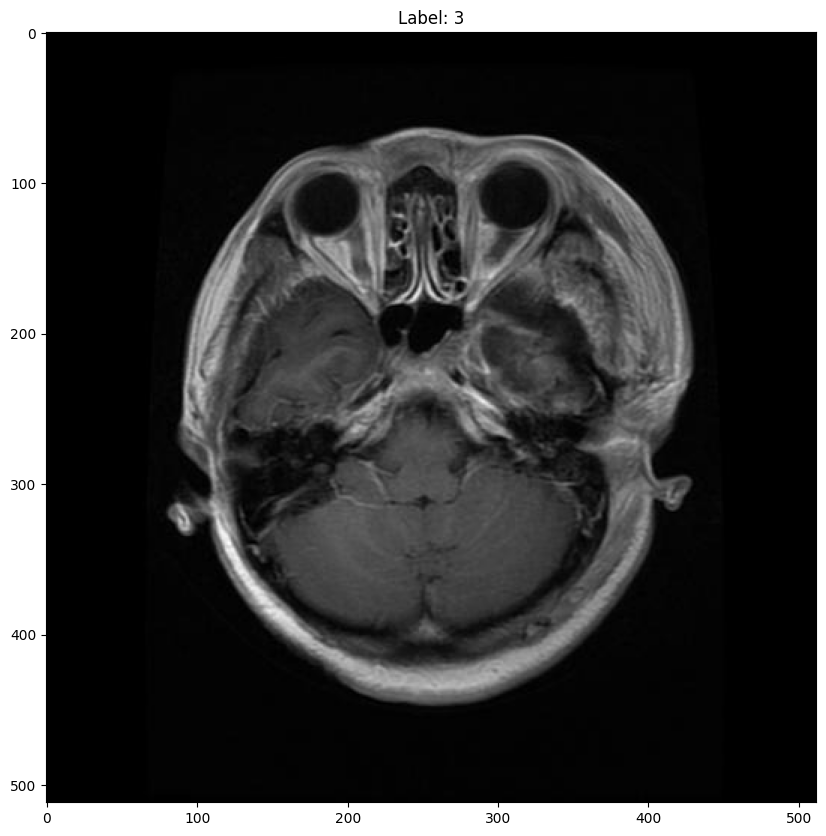

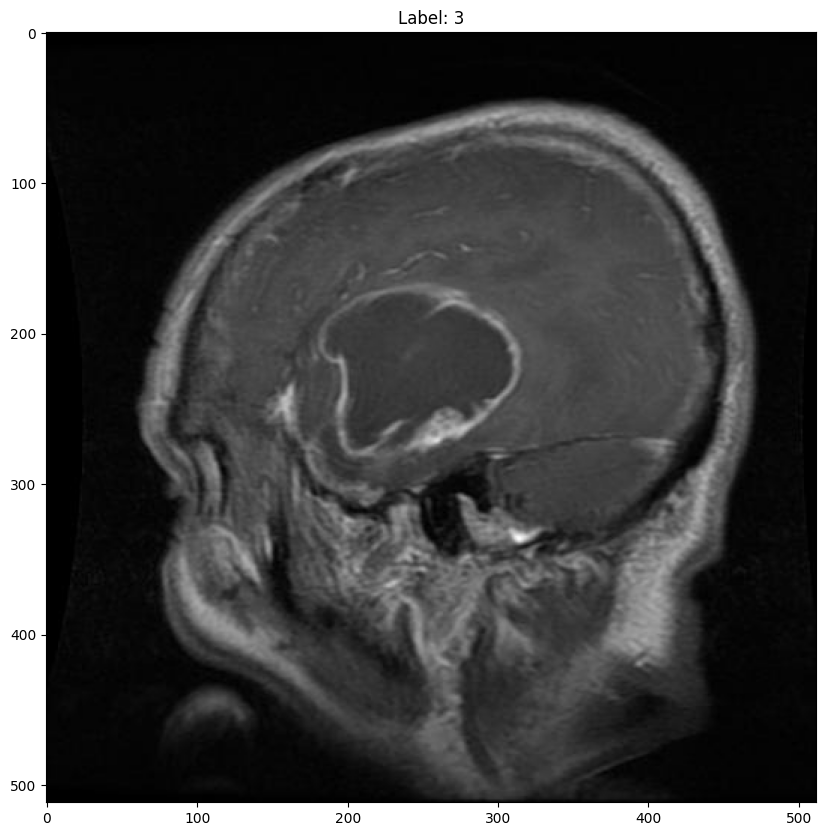

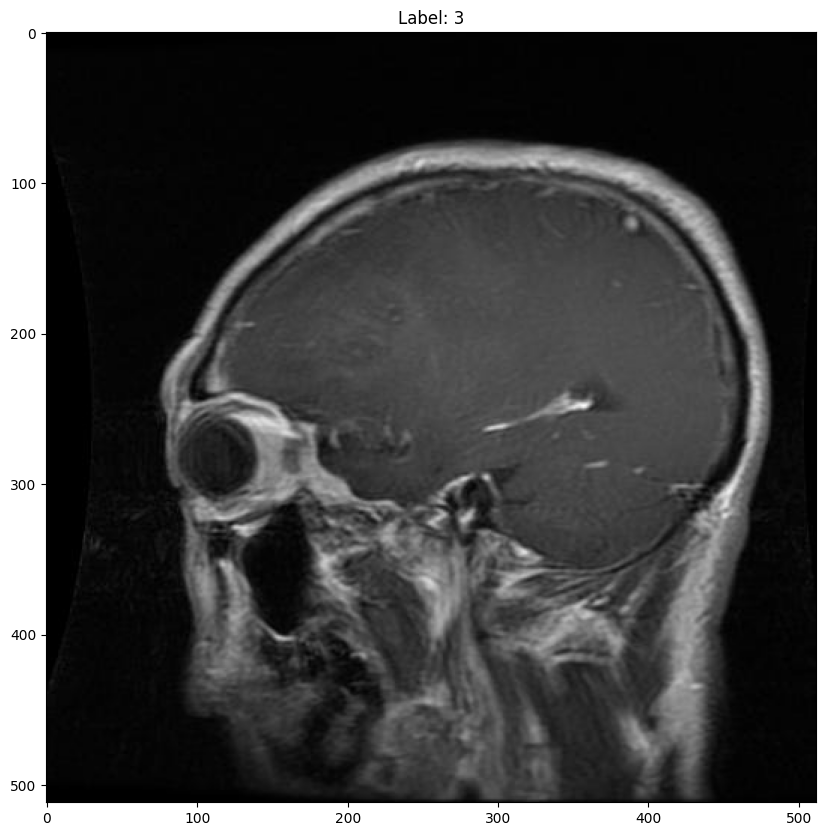

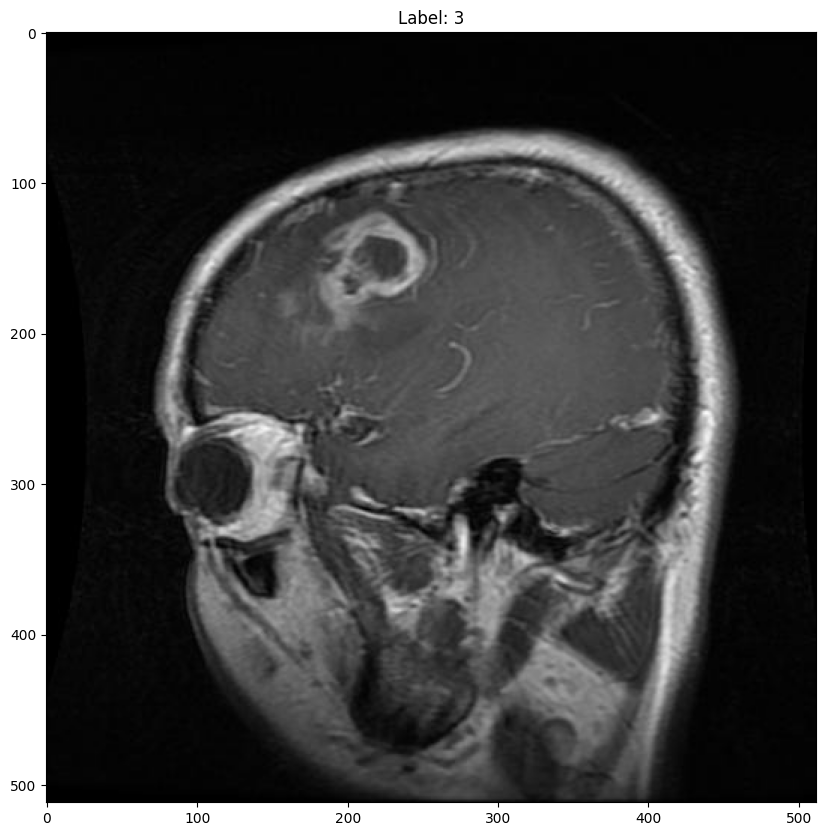

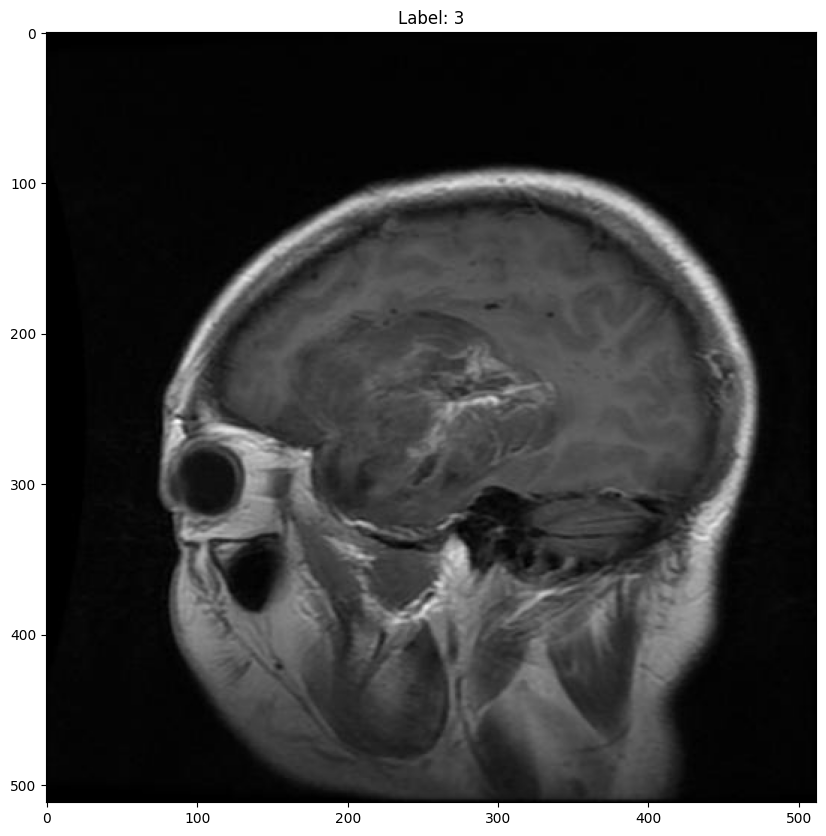

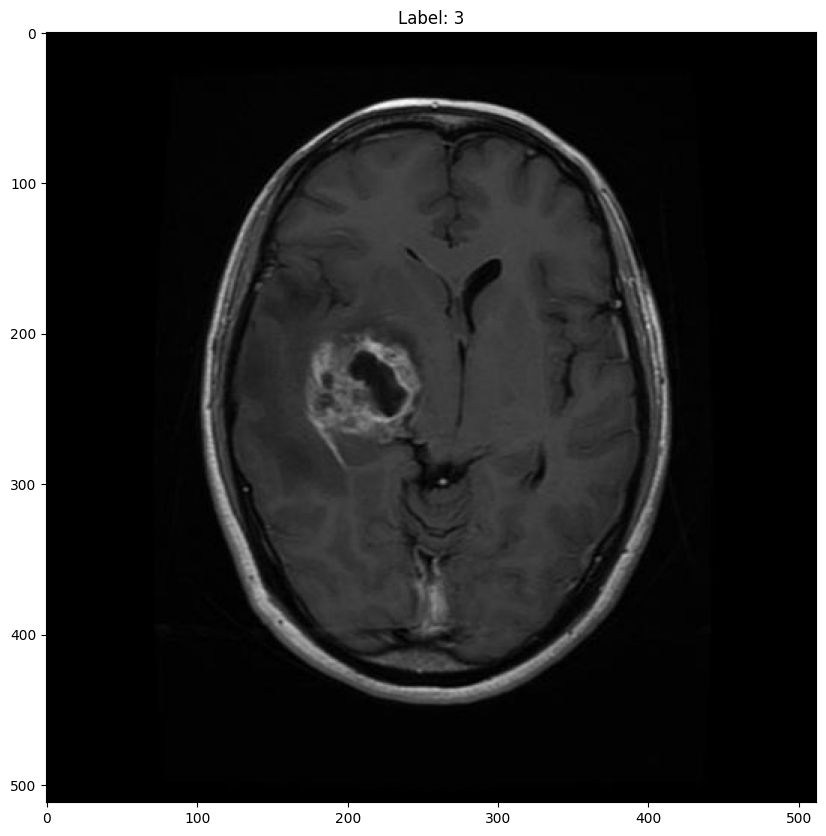

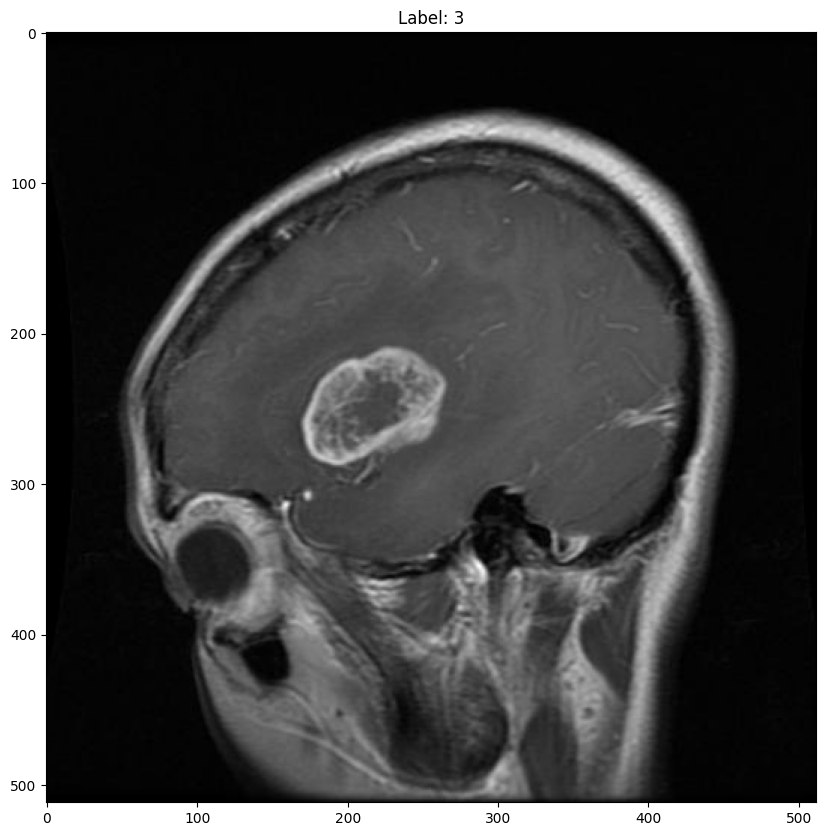

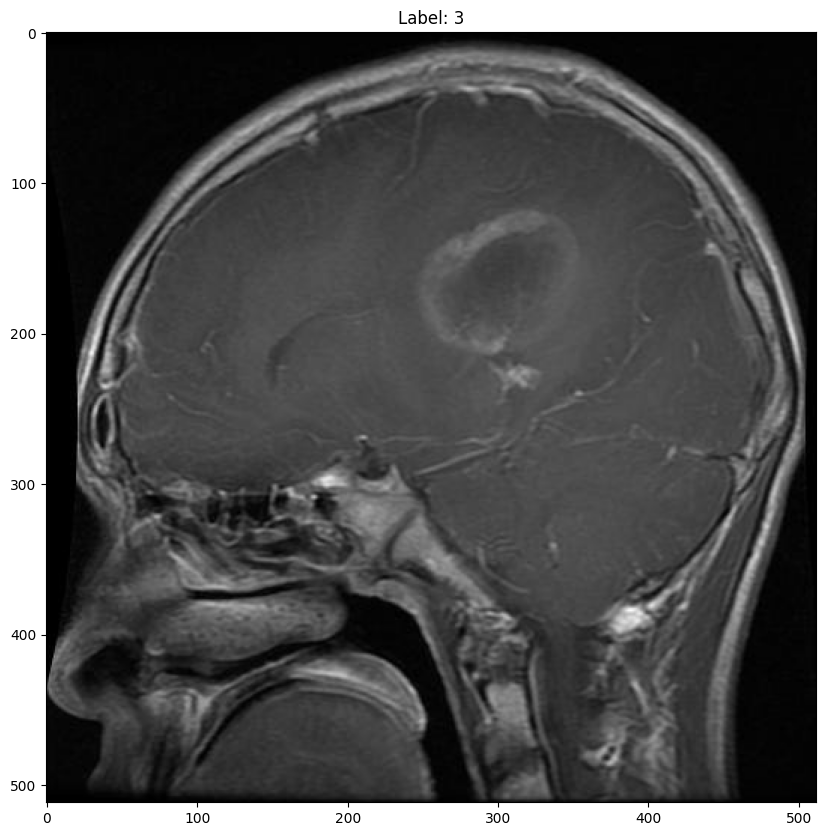

In [11]:
show_images(images_train, label_train[:826])

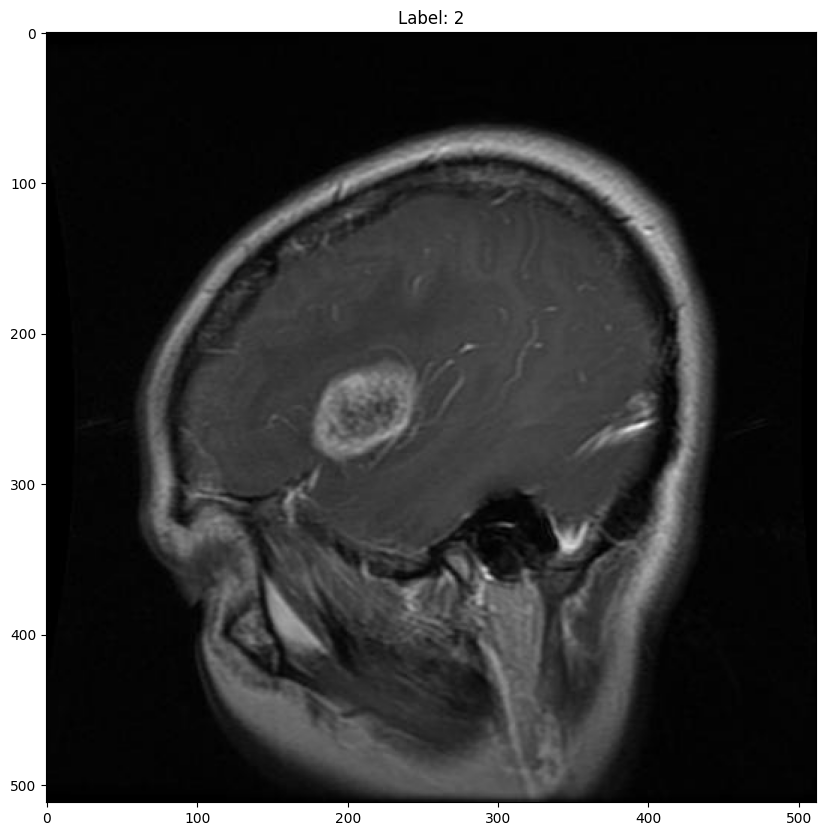

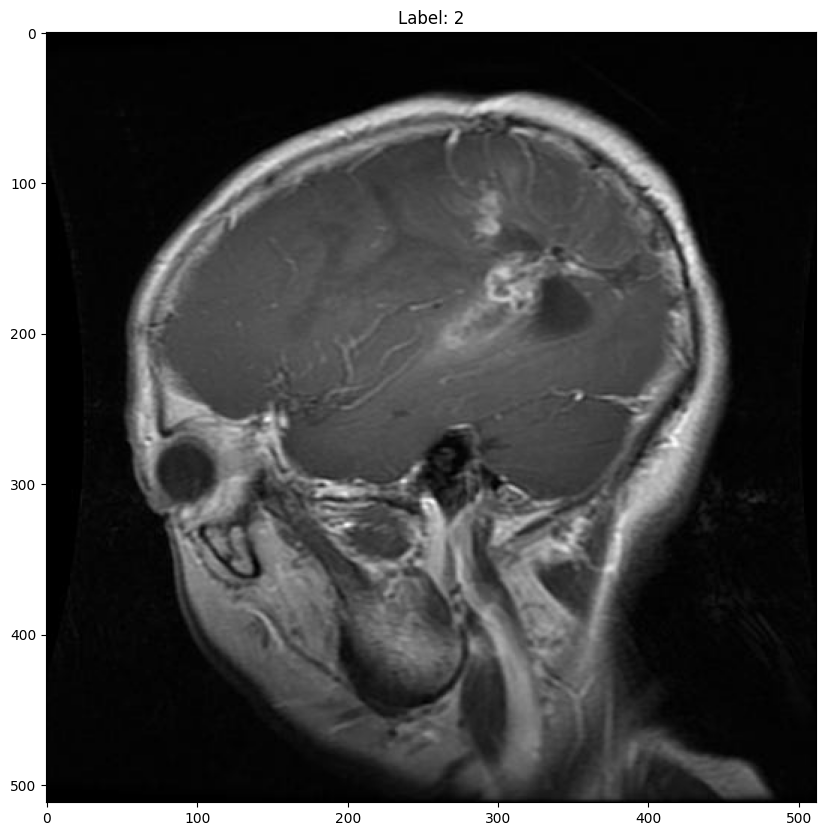

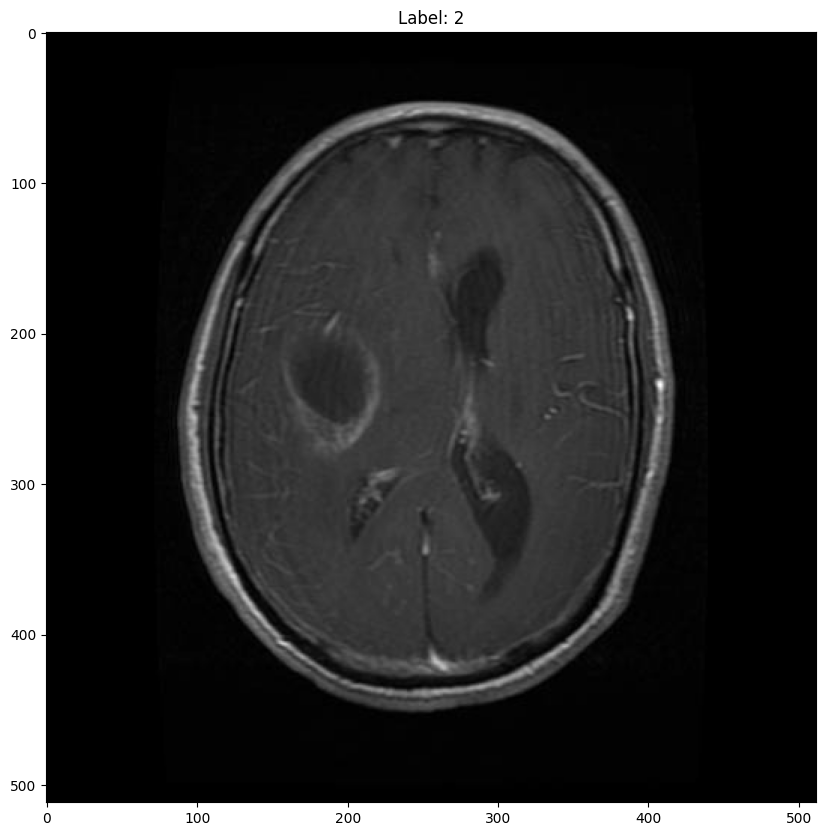

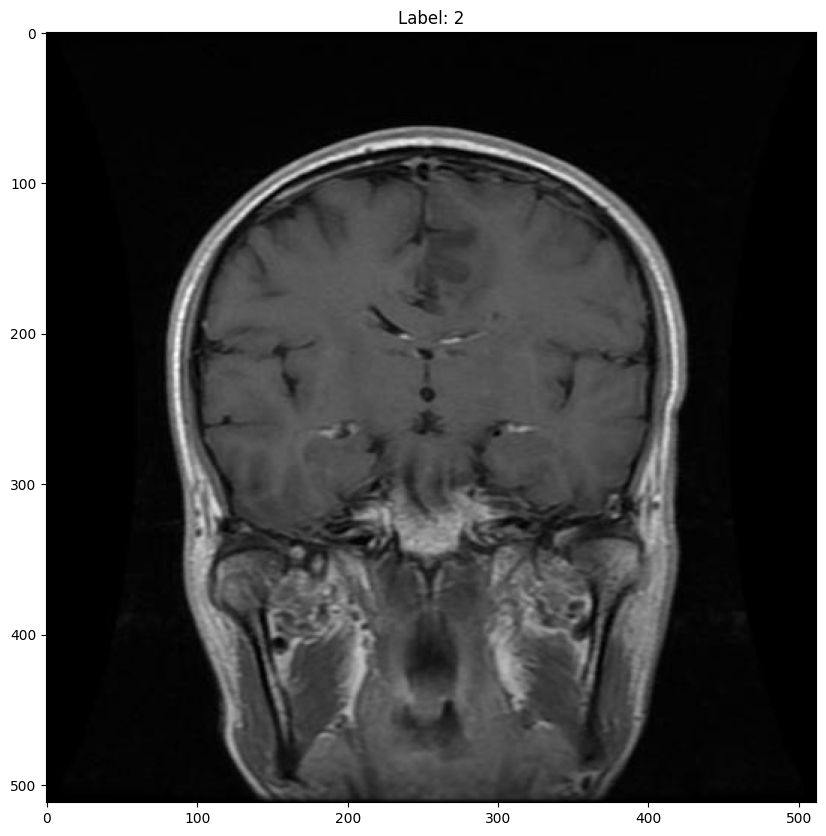

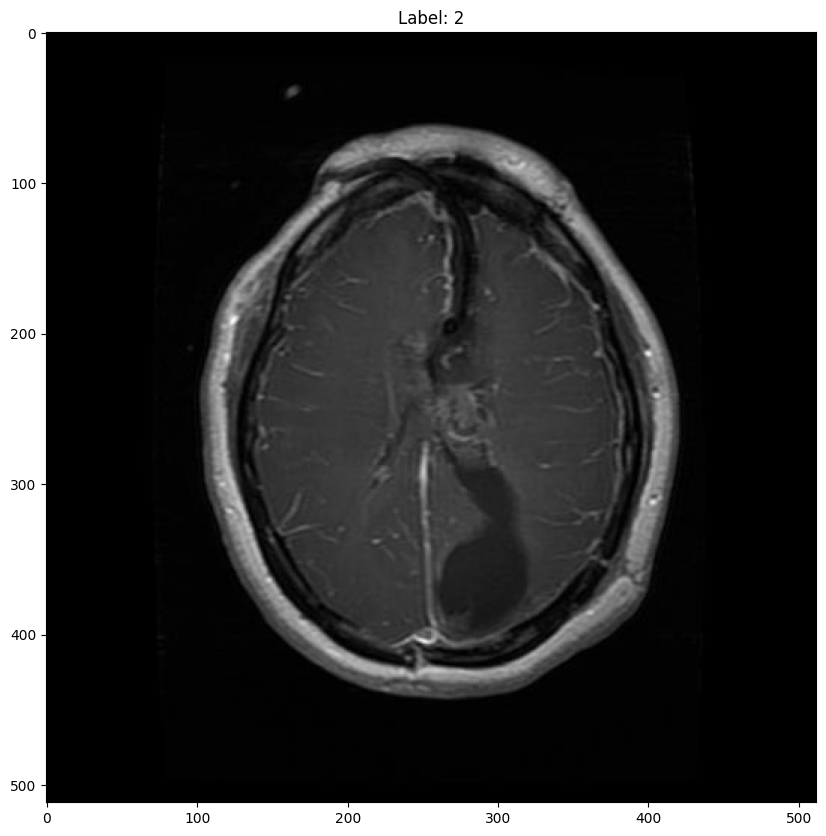

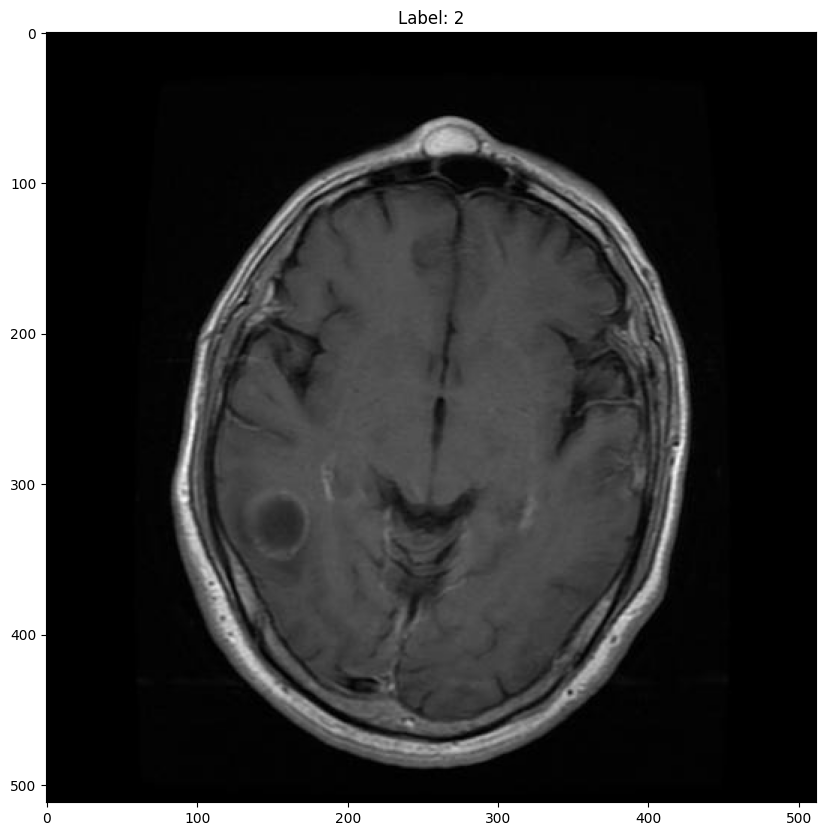

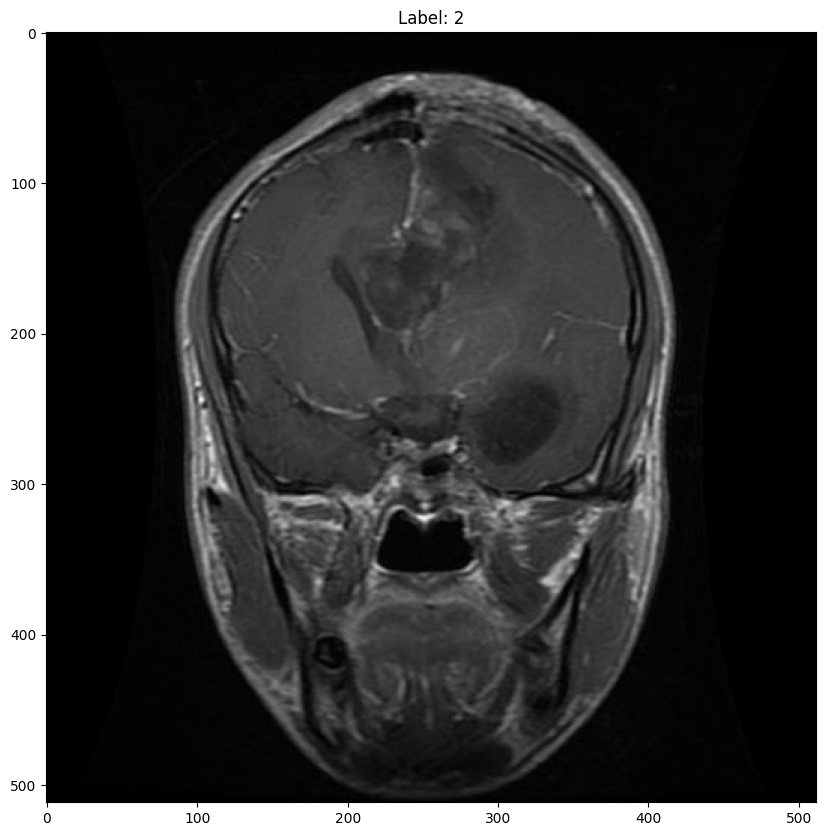

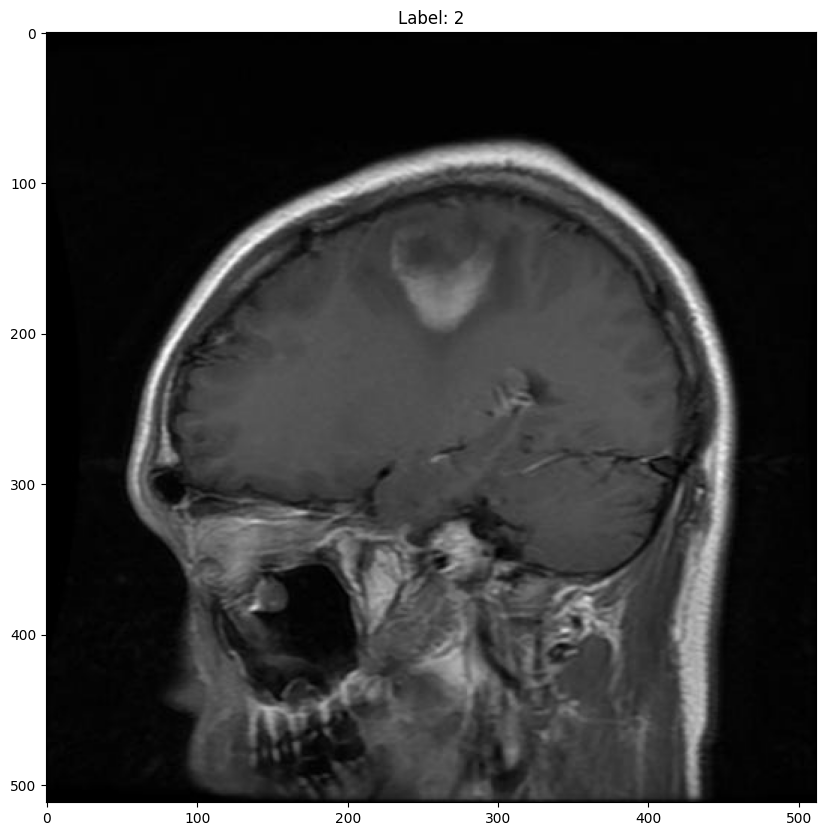

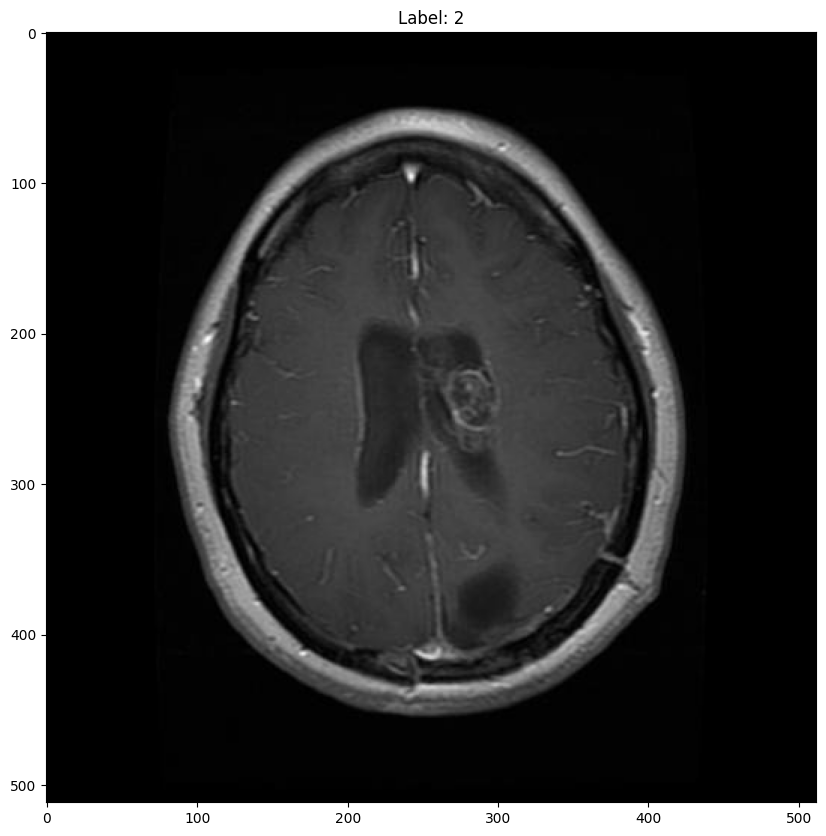

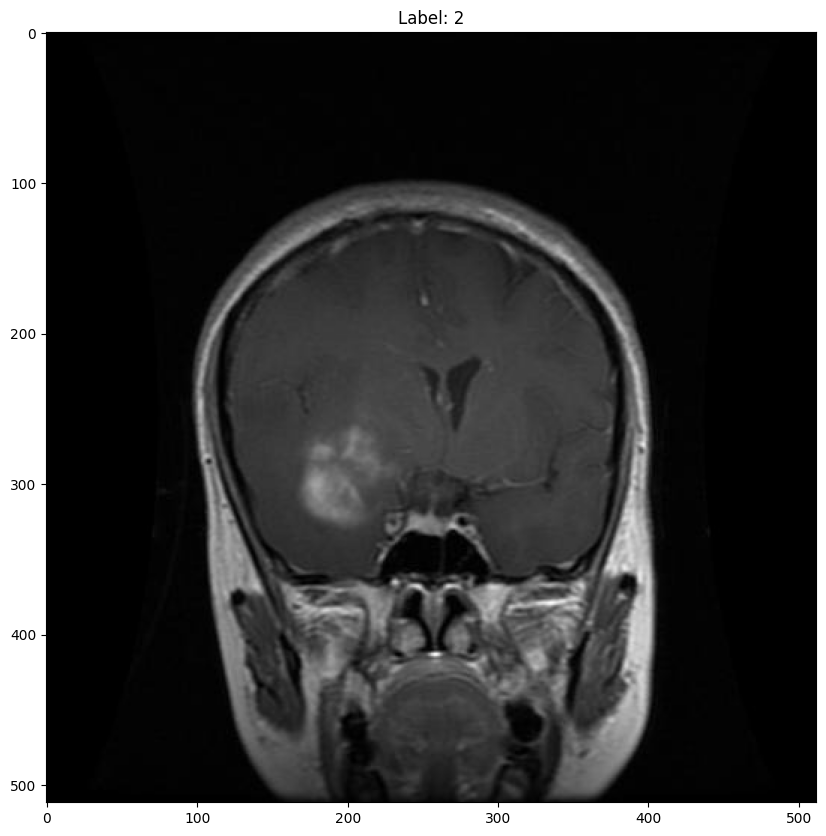

In [12]:
show_images(images_train, label_train[826:1648])

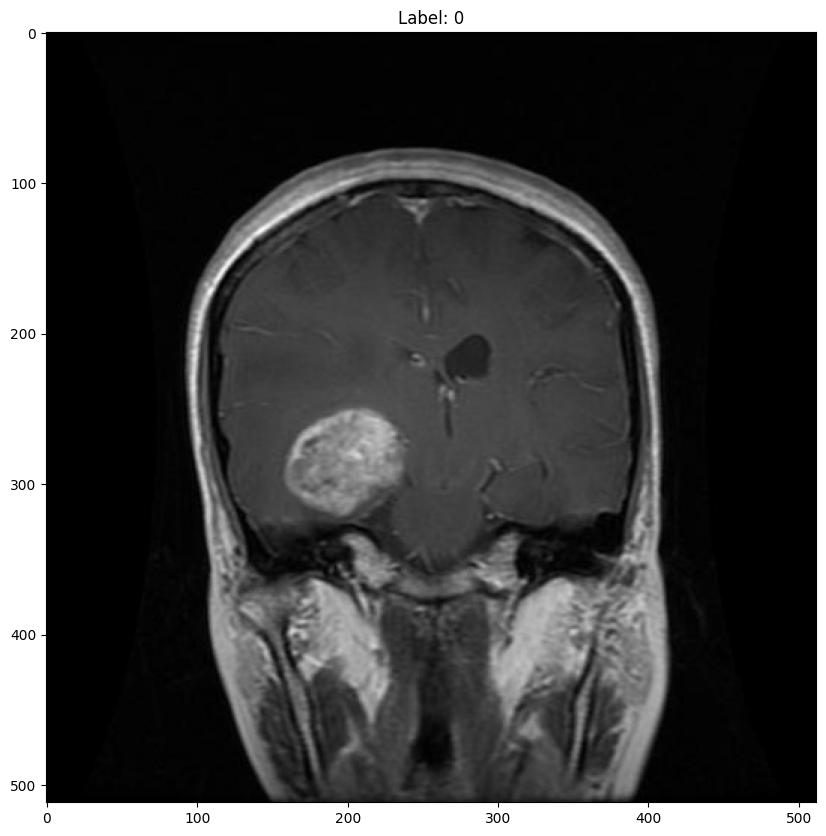

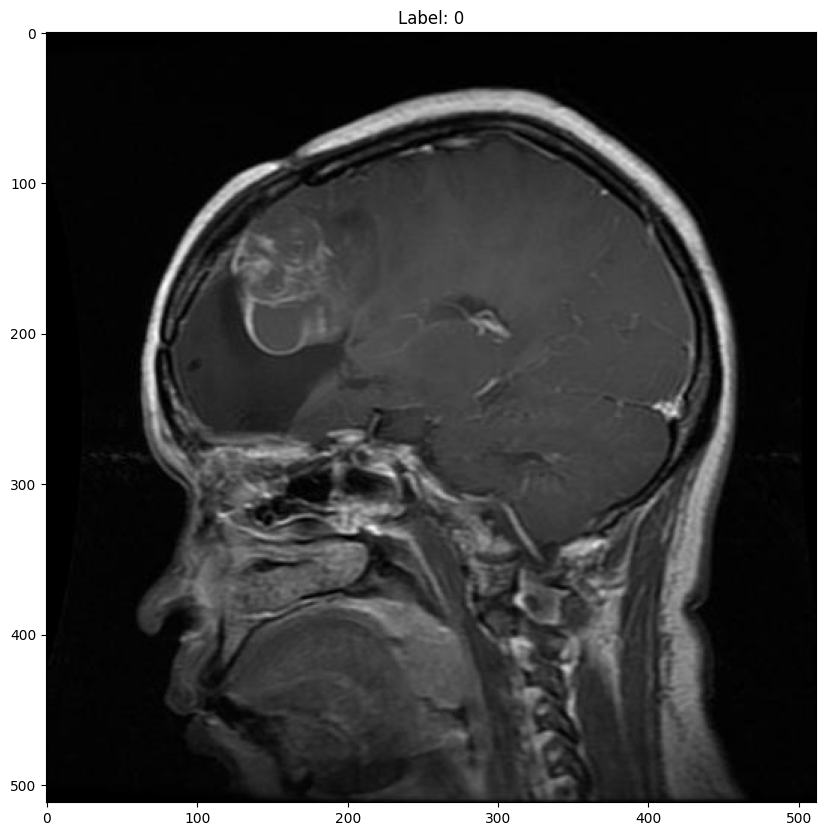

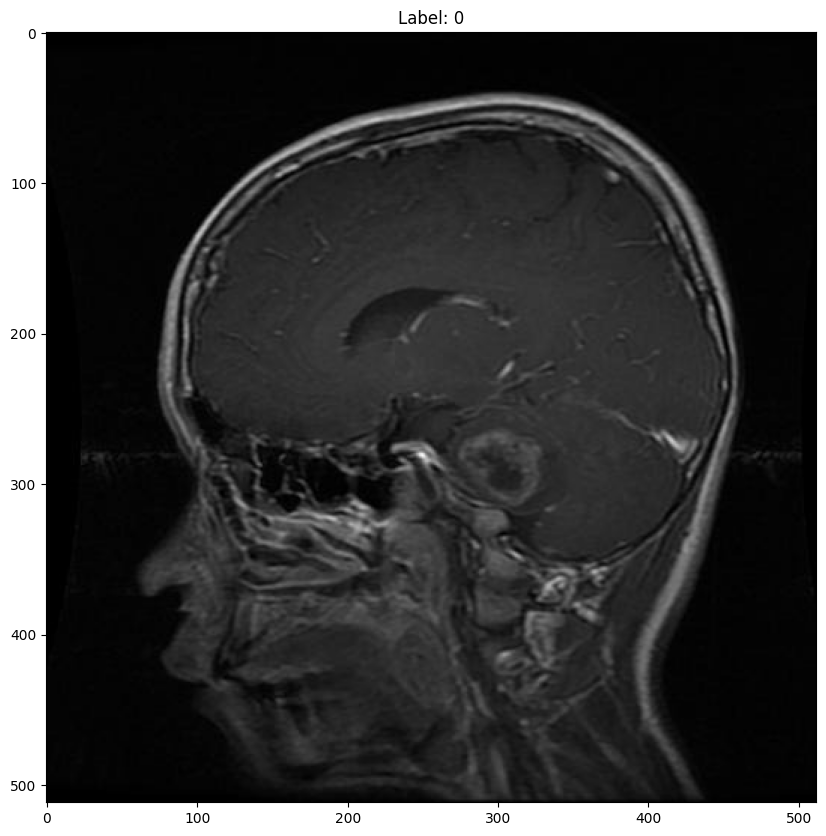

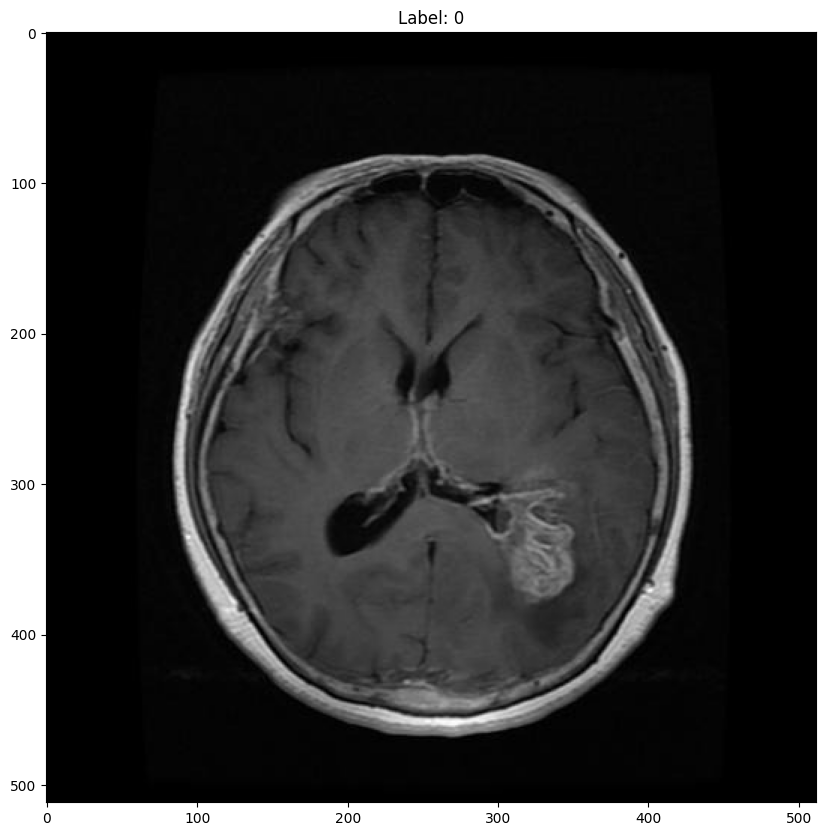

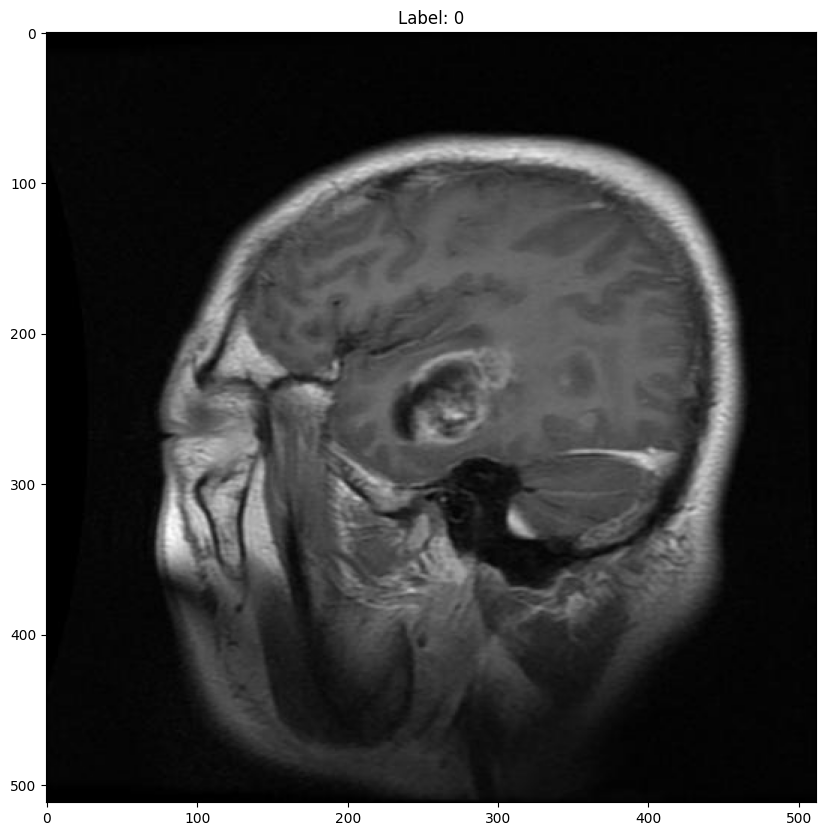

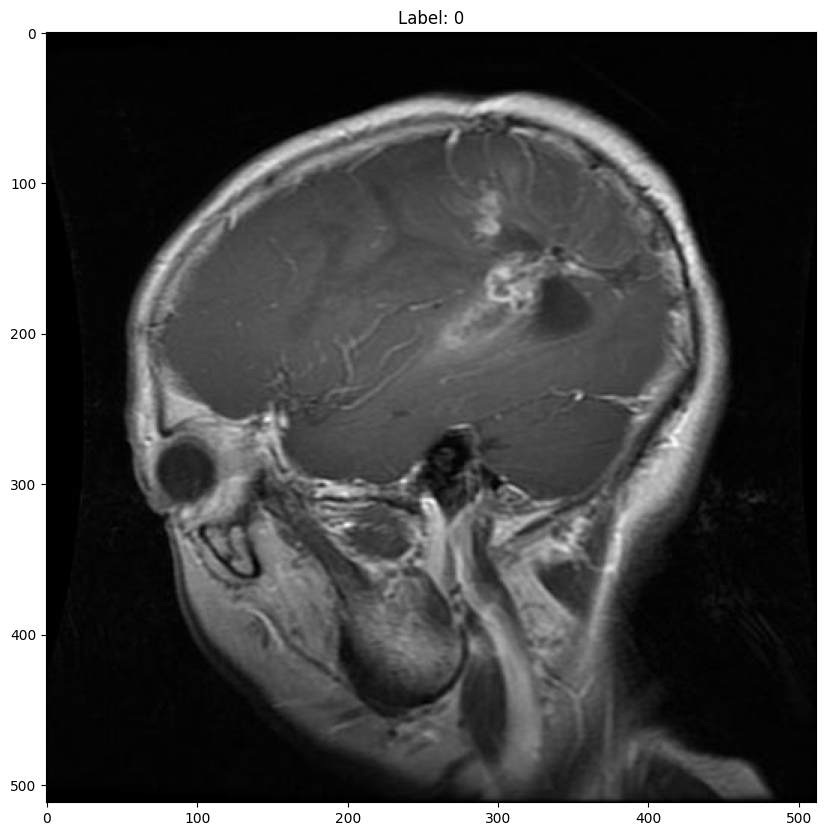

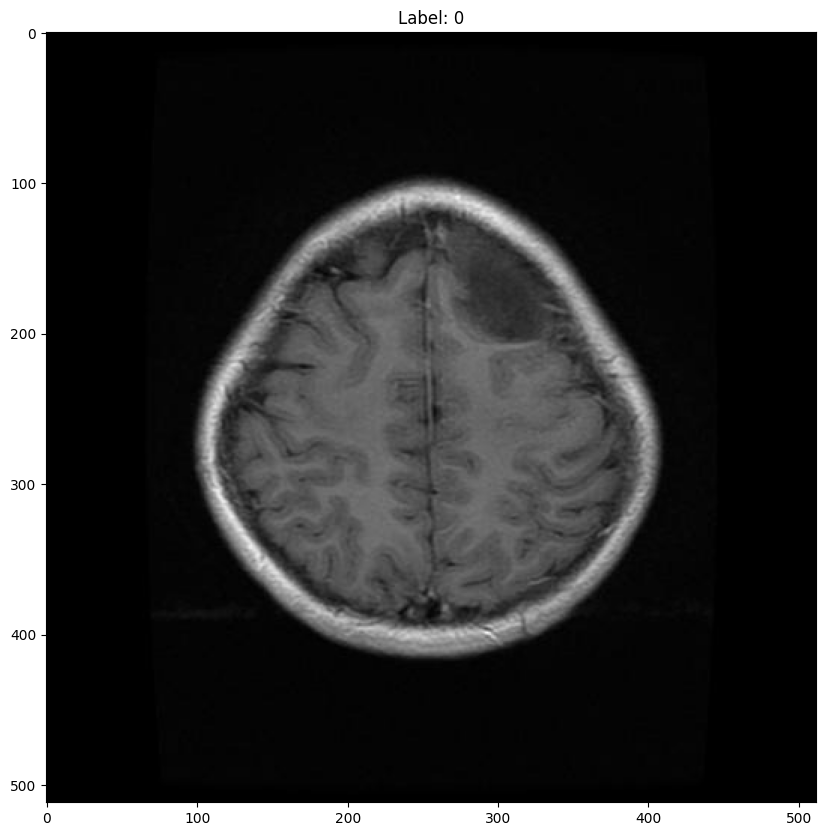

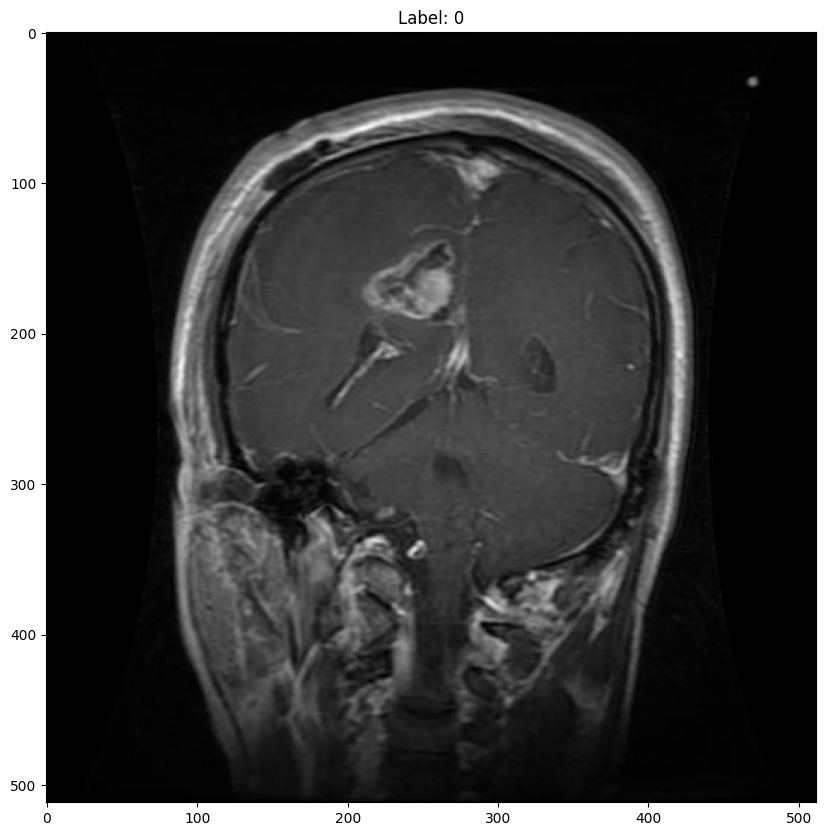

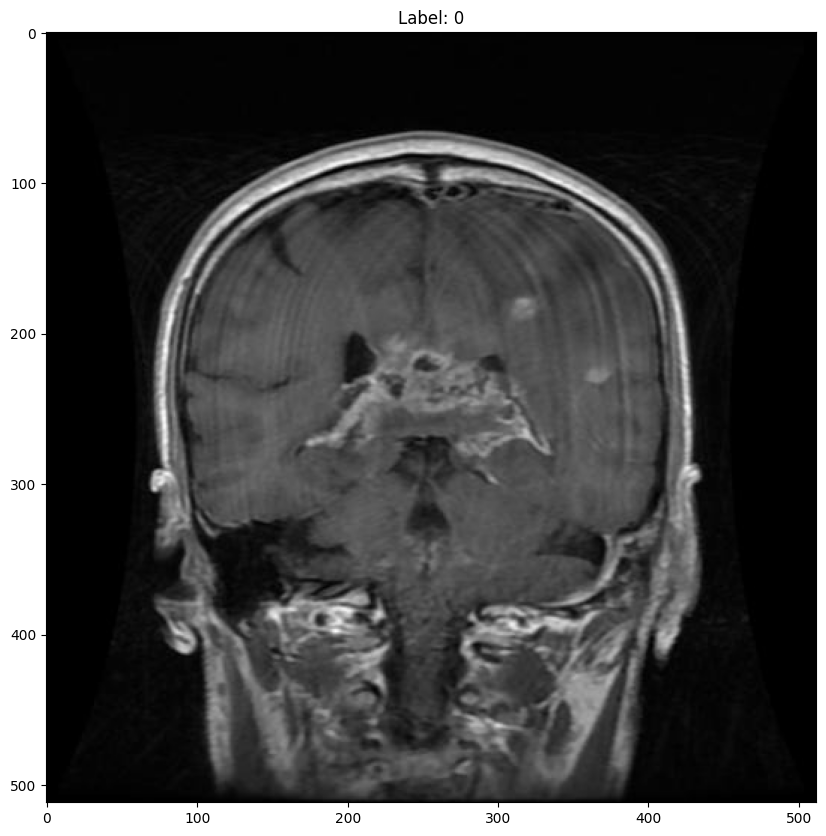

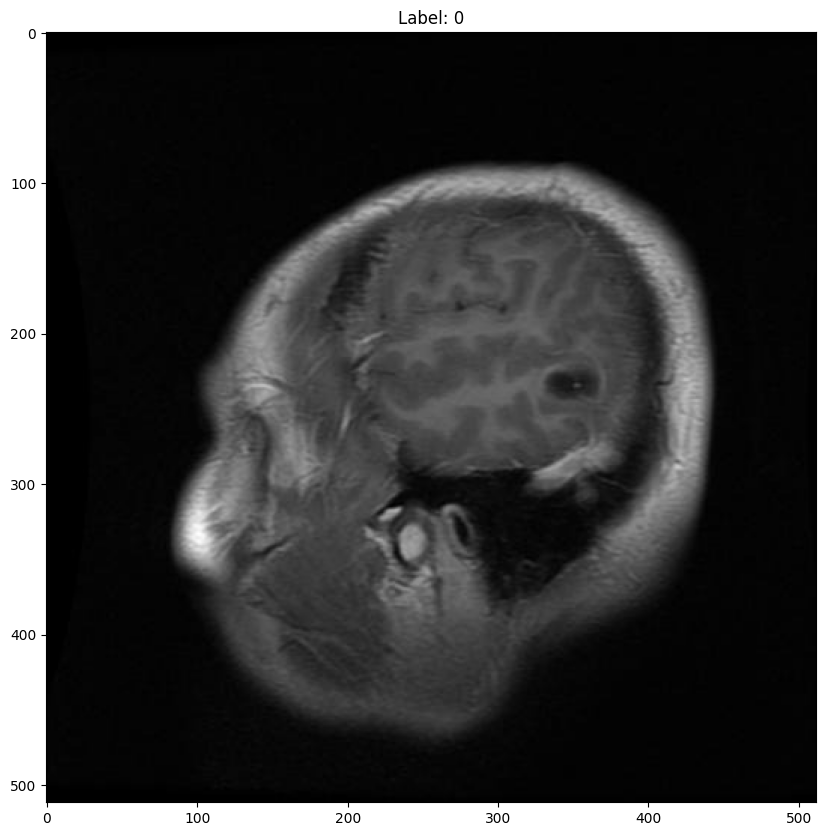

In [13]:
show_images(images_train, label_train[1648:2043])

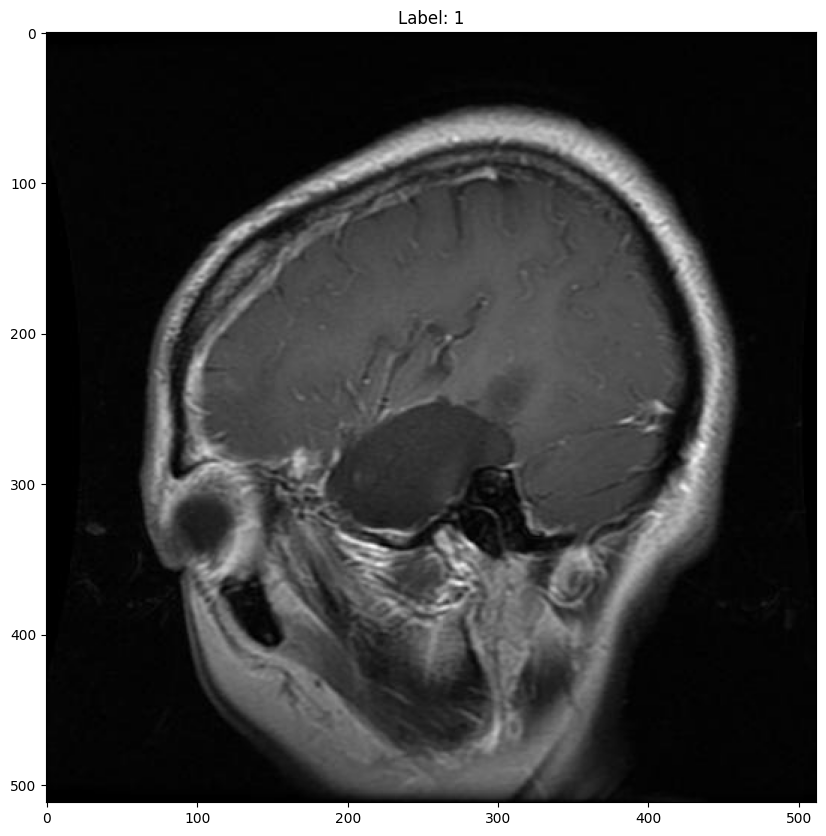

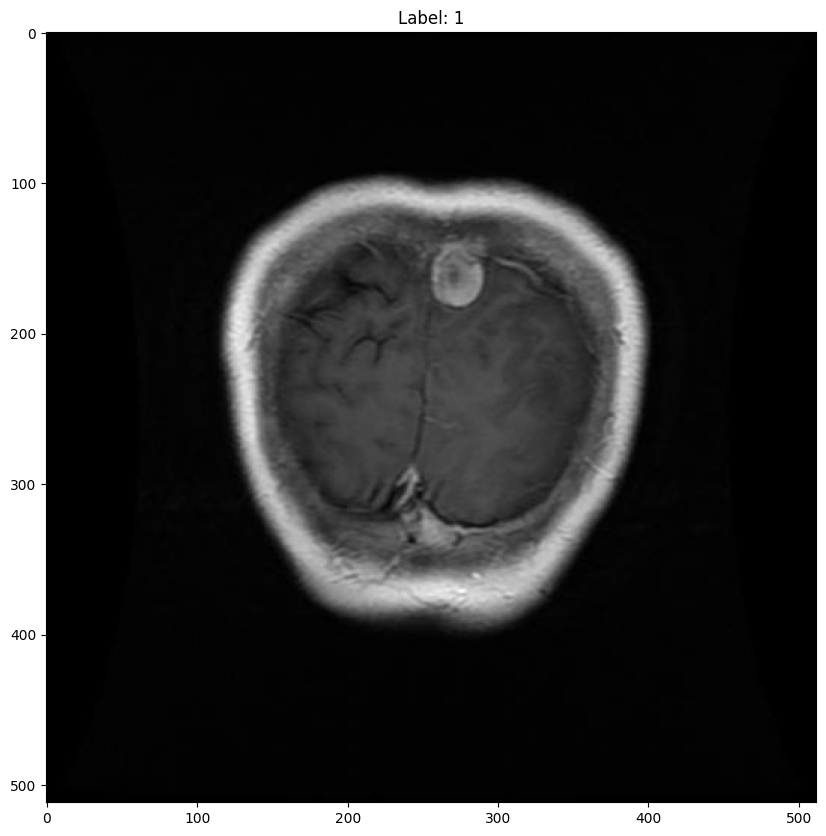

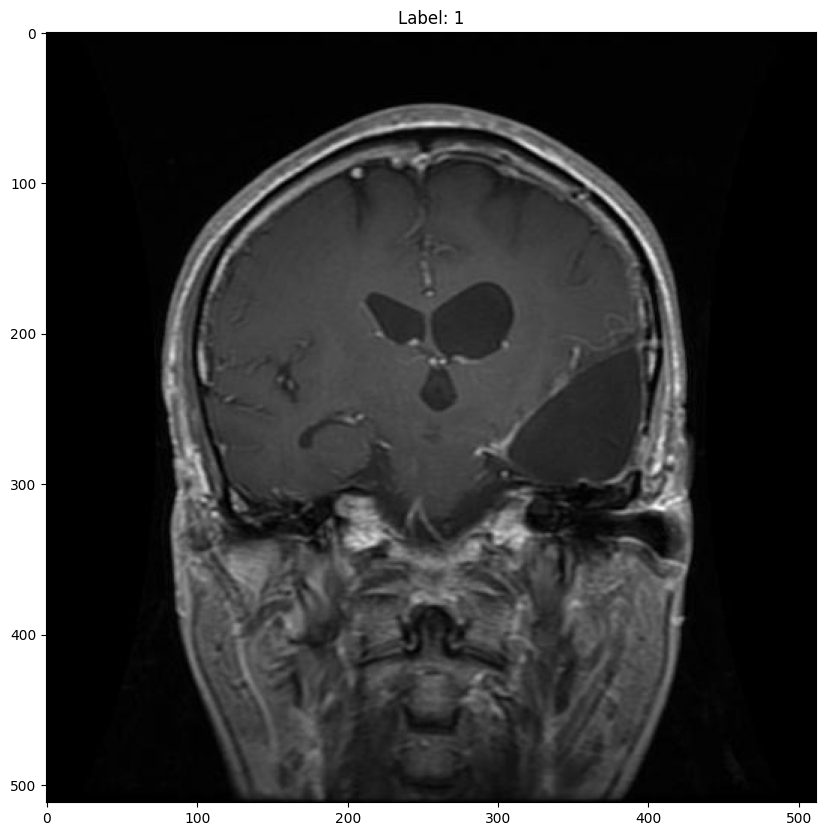

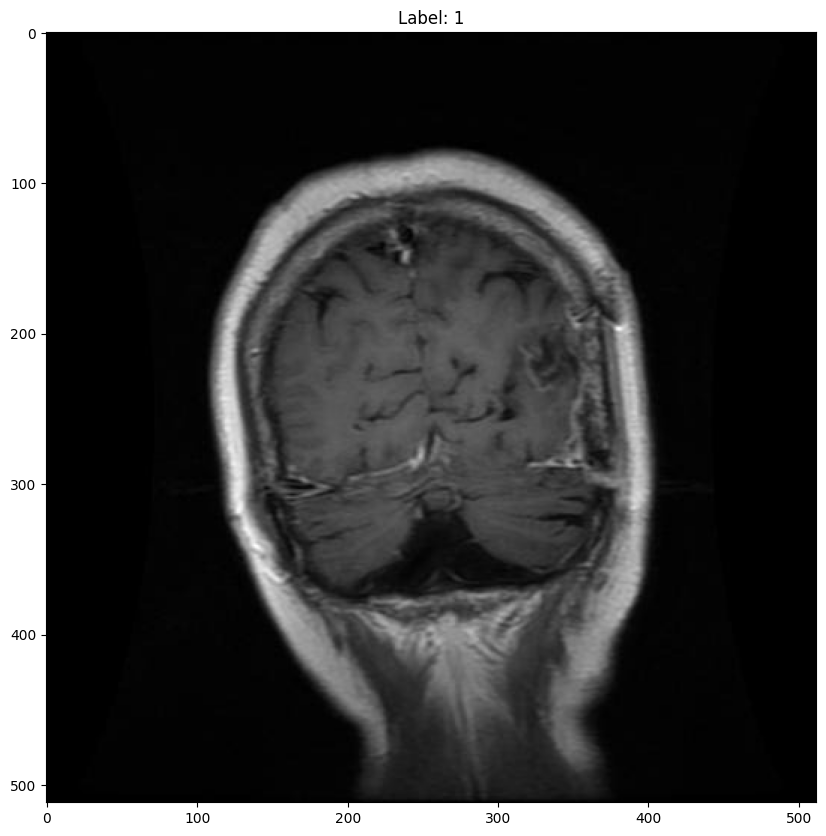

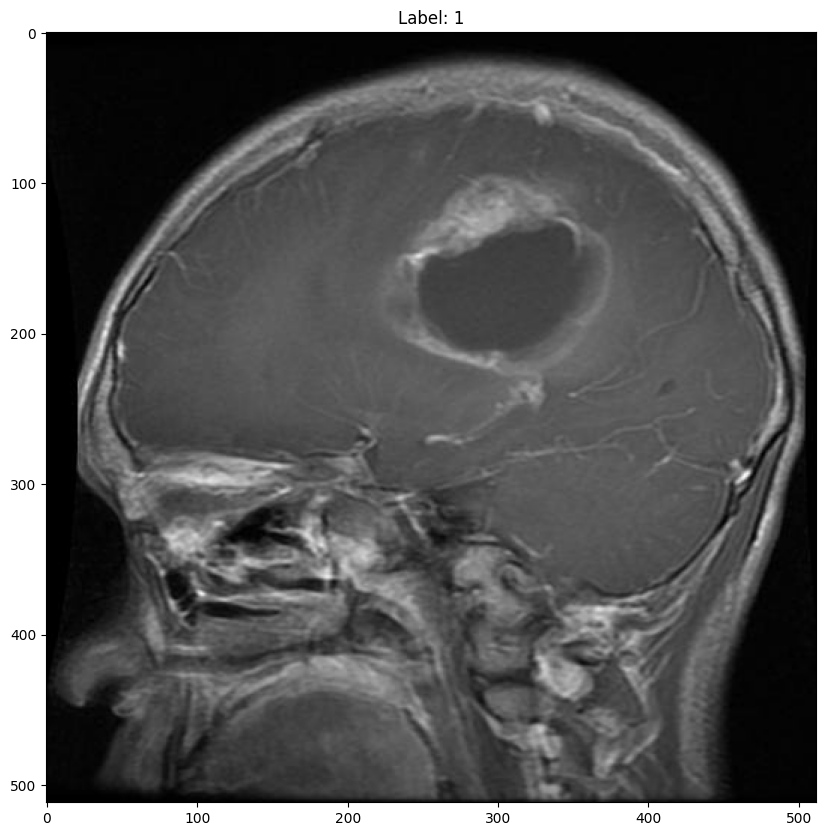

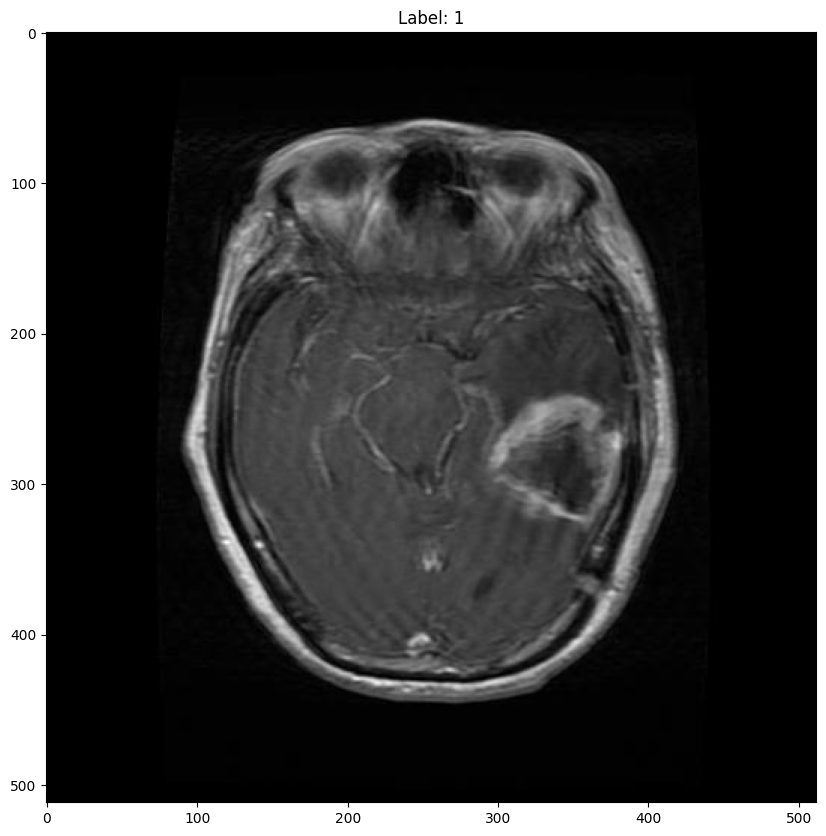

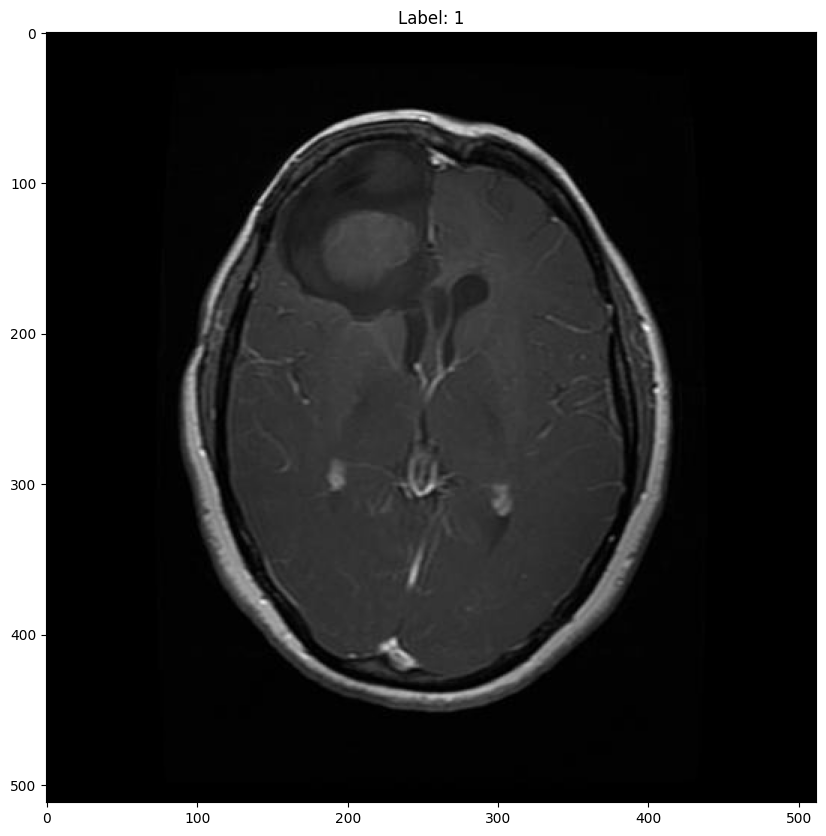

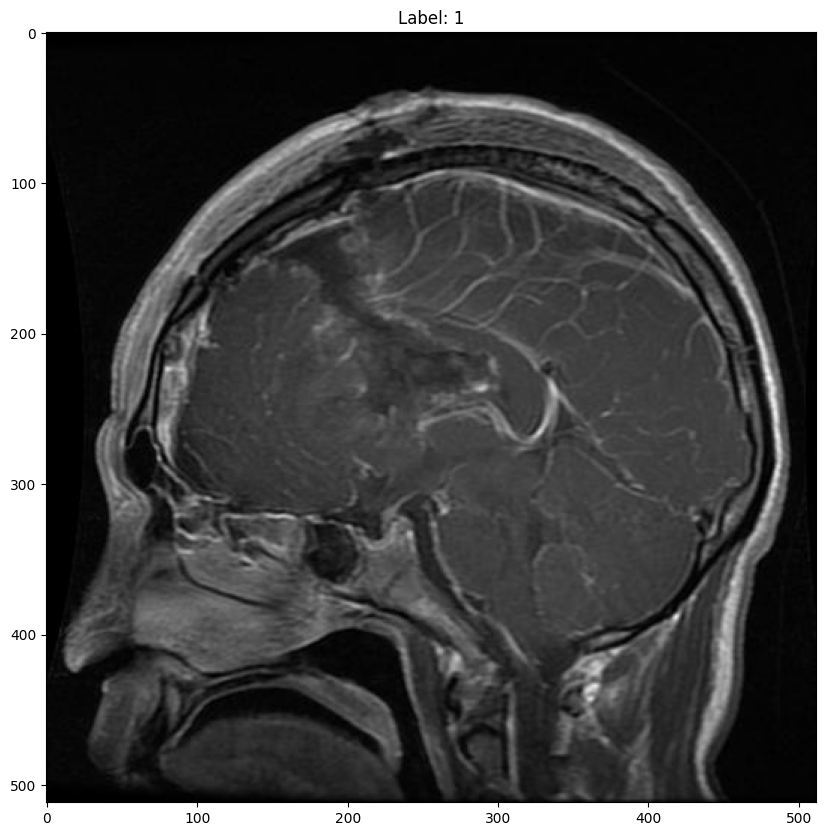

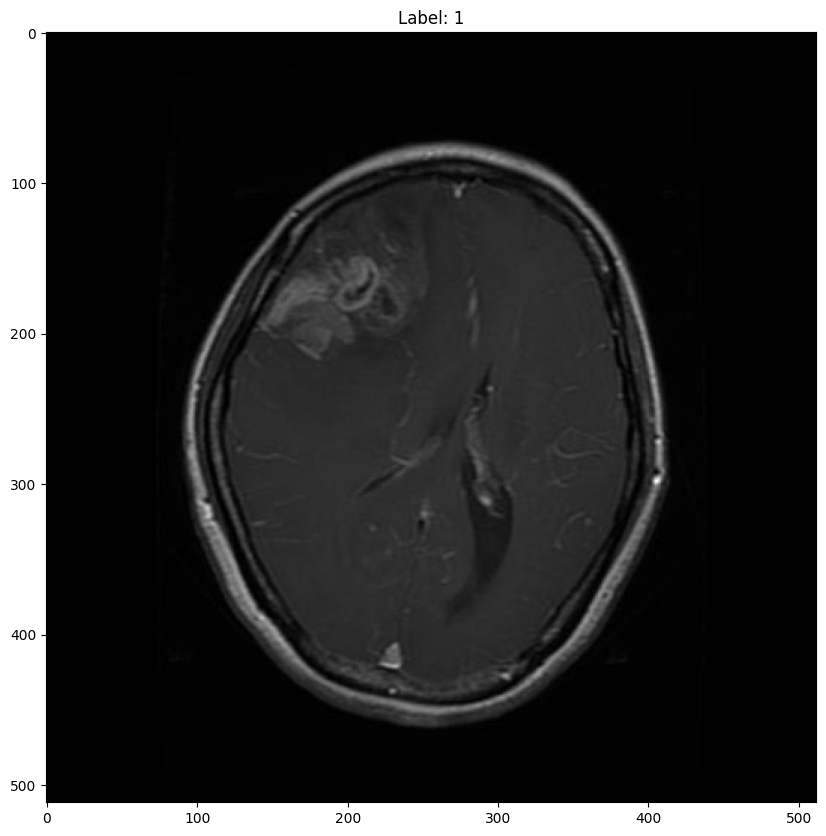

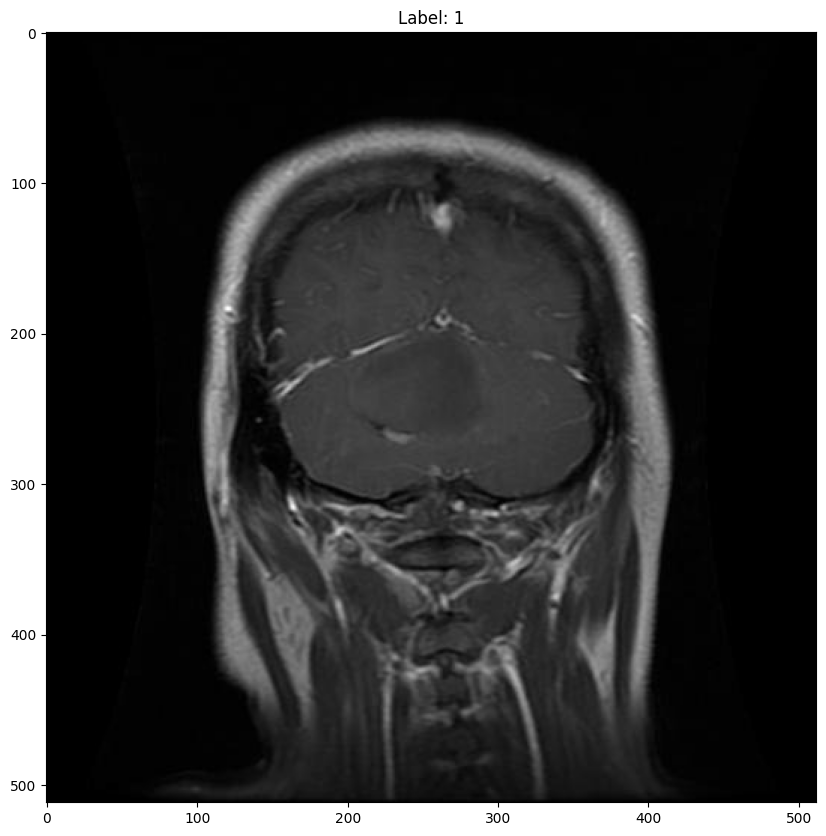

In [14]:
show_images(images_train, label_train[2043:])

In [15]:
# for train dataset:
modes = set()
sizes = set()
scales = set()
for path in images_train:
    image = PIL.Image.open(path)
    modes.add(image.mode)
    sizes.add(image.size)
    scales.add(image.info.get("dpi"))

print(modes)
print(sizes)
print(scales)


{'RGB'}
{(491, 624), (206, 244), (409, 442), (503, 369), (430, 483), (728, 725), (201, 251), (289, 354), (554, 554), (236, 226), (214, 216), (229, 214), (733, 781), (229, 223), (235, 257), (329, 310), (411, 501), (645, 439), (434, 512), (227, 262), (528, 528), (590, 332), (209, 241), (407, 485), (630, 423), (300, 359), (236, 203), (502, 502), (236, 221), (236, 239), (550, 664), (226, 213), (411, 496), (1024, 830), (235, 261), (374, 456), (329, 314), (355, 452), (626, 686), (276, 326), (300, 345), (210, 213), (359, 449), (201, 250), (221, 228), (236, 216), (202, 223), (225, 225), (410, 490), (605, 613), (216, 234), (208, 248), (350, 350), (444, 506), (450, 446), (442, 442), (534, 674), (257, 307), (402, 396), (224, 219), (341, 377), (421, 486), (926, 649), (213, 237), (341, 395), (825, 993), (236, 220), (447, 251), (235, 233), (622, 777), (494, 600), (208, 243), (228, 221), (239, 248), (600, 605), (314, 260), (201, 249), (341, 372), (224, 223), (212, 236), (1365, 1365), (275, 301), (235

In [16]:
modes = set()
sizes = set()
scales = set()
for path in images_test:
    image = PIL.Image.open(path)
    modes.add(image.mode)
    sizes.add(image.size)
    scales.add(image.info.get("dpi"))

print(modes)
print(sizes)
print(scales)

{'RGB'}
{(620, 415), (411, 396), (278, 306), (491, 624), (625, 603), (338, 345), (200, 234), (208, 217), (200, 243), (373, 378), (200, 252), (201, 251), (236, 251), (222, 252), (318, 354), (236, 315), (1358, 1322), (306, 306), (289, 354), (383, 407), (528, 581), (546, 562), (278, 253), (204, 249), (554, 554), (330, 355), (235, 227), (276, 320), (1335, 1302), (236, 290), (200, 236), (504, 608), (211, 236), (470, 432), (374, 370), (530, 526), (249, 238), (214, 216), (334, 407), (201, 207), (220, 275), (212, 237), (440, 278), (645, 439), (213, 236), (369, 419), (323, 342), (290, 339), (216, 216), (235, 229), (305, 337), (236, 228), (209, 241), (351, 398), (630, 423), (565, 513), (300, 258), (400, 400), (436, 429), (354, 442), (326, 405), (394, 368), (502, 502), (234, 224), (455, 500), (291, 340), (540, 568), (209, 234), (524, 581), (314, 195), (425, 349), (200, 249), (174, 230), (685, 681), (235, 261), (472, 546), (315, 315), (236, 260), (282, 257), (353, 427), (256, 256), (300, 345), (55

In [17]:
def open_image(path):
    image = PIL.Image.open(path)
    return image

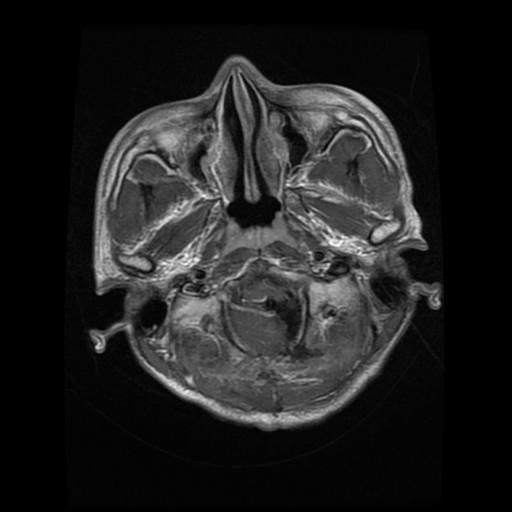

In [18]:
image = open_image(images_train[0])
image

In [19]:
from PIL import Image, ImageFilter
def gaussian_blur(image, radius=0.1):
    return image.filter(PIL.ImageFilter.GaussianBlur(radius))

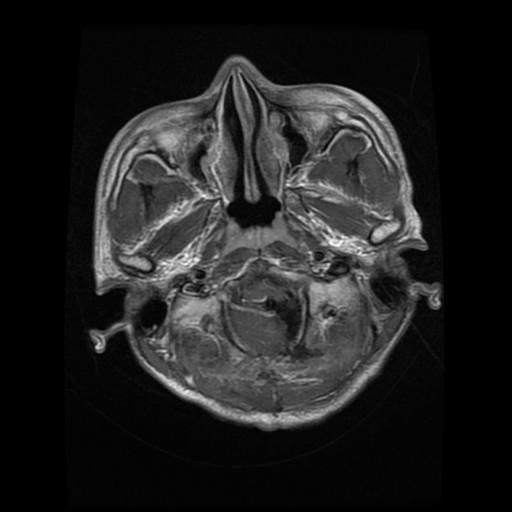

In [20]:
gaussian_blur(image)

In [21]:
def autocontrast(image):
    return PIL.ImageOps.autocontrast(image)

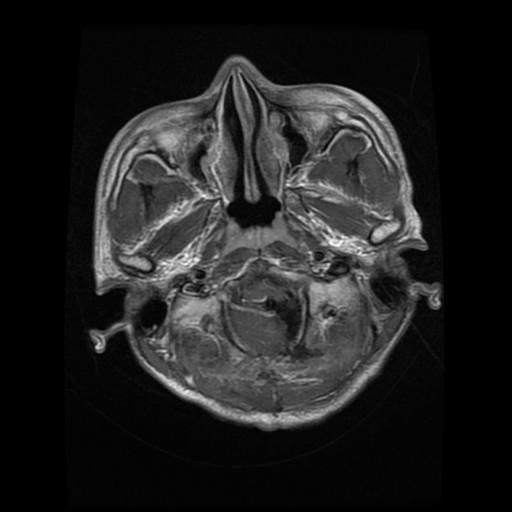

In [22]:
autocontrast(image)

In [23]:
def sharpeness(image):
    return image.filter(PIL.ImageFilter.SHARPEN)

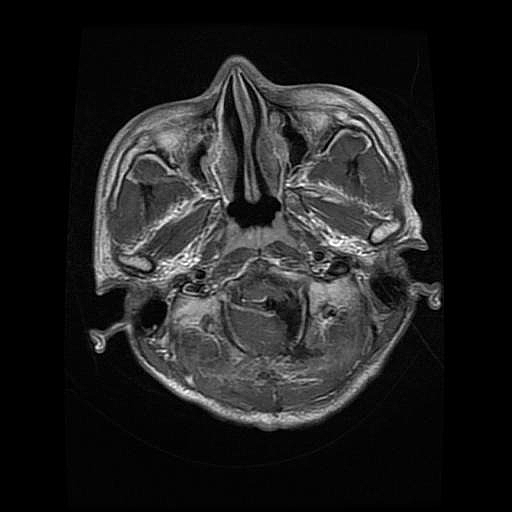

In [24]:
sharpeness(image)

In [25]:
import albumentations as A

In [26]:
import cv2
def transform_PIL_to_cv2(image):
    np_image = np.array(image)
    imagev2 = cv2.cvtColor(np_image, cv2.COLOR_RGB2BGR)
    return imagev2

In [27]:
imagev2 = transform_PIL_to_cv2(image)

In [28]:
def apply_clahe(image, clip_limit=1.0, tile_grid_size=(32, 32)):
  clahe_transform = A.CLAHE(clip_limit=clip_limit, tile_grid_size=tile_grid_size, always_apply=True)
  transformed = clahe_transform(image=image)
  clahe_image = transformed['image']

  return clahe_image

In [29]:
apply_clahe(imagev2)

array([[[3, 3, 3],
        [3, 3, 3],
        [3, 3, 3],
        ...,
        [3, 3, 3],
        [3, 3, 3],
        [3, 3, 3]],

       [[3, 3, 3],
        [3, 3, 3],
        [3, 3, 3],
        ...,
        [3, 3, 3],
        [3, 3, 3],
        [3, 3, 3]],

       [[3, 3, 3],
        [3, 3, 3],
        [3, 3, 3],
        ...,
        [3, 3, 3],
        [3, 3, 3],
        [3, 3, 3]],

       ...,

       [[3, 3, 3],
        [3, 3, 3],
        [3, 3, 3],
        ...,
        [3, 3, 3],
        [3, 3, 3],
        [3, 3, 3]],

       [[3, 3, 3],
        [3, 3, 3],
        [3, 3, 3],
        ...,
        [3, 3, 3],
        [3, 3, 3],
        [3, 3, 3]],

       [[3, 3, 3],
        [3, 3, 3],
        [3, 3, 3],
        ...,
        [3, 3, 3],
        [3, 3, 3],
        [3, 3, 3]]], dtype=uint8)

In [30]:
def transform_cv2_to_PIL(image):
    return PIL.Image.fromarray(cv2.cvtColor(image, cv2.COLOR_BGR2GRAY))


In [34]:
from torchvision import transforms
def rotate(image):
    return transforms.functional.rotate(image, angle=10)

In [47]:
from torchvision import transforms
transforms_img = transforms.Compose(
    [
        open_image,
        transforms.Resize(size=(256, 256)),
        gaussian_blur,
        autocontrast,
        sharpeness,
        transform_PIL_to_cv2,
        transform_cv2_to_PIL,
        rotate,
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485], std=[0.229])
    ]
)

In [48]:
transforms_val = transforms.Compose(
    [
        open_image,
        transform_PIL_to_cv2,
        transform_cv2_to_PIL,
        transforms.Resize(size=(256, 256)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485], std=[0.229])
    ]
)

In [49]:
from monai.transforms import Activations
from monai.transforms import AsDiscrete

In [50]:
y_pred_trans = transforms.Compose([Activations(softmax=True)])
y_trans = transforms.Compose([AsDiscrete(to_onehot=4)])

In [51]:
train_dataset = Dataset(train_x, train_y, transforms_img)
val_dataset = Dataset(val_x, val_y, transforms_val)

In [52]:
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=128, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=128, shuffle=True)

In [53]:
class LeNet(nn.Module):
    def __init__(self, in_size, out_size):
        super().__init__()
        self.conv1 = nn.Conv2d(in_size, 4, kernel_size=4, stride=2, padding=1, dilation=1)
        self.relu1 = nn.ReLU()
        self.avg = nn.MaxPool2d(kernel_size=4, stride=3)
        self.conv2 = nn.Conv2d(4, 8, kernel_size=4, stride=2, padding=1, dilation=1)
        self.drop = nn.Dropout(p=0.2)
        self.relu2 = nn.ReLU()
        self.flatten = nn.Flatten()
        self.linear = nn.Linear(3528, 4)

    def forward(self, x):
        x = self.conv1(x)
        x = self.relu1(x)
        x = self.avg(x)
        x = self.conv2(x)
        x = self.drop(x)
        x = self.relu2(x)
        x = self.flatten(x)
        x = self.linear(x)
        return x

    def name(self):
        return "LeNet"

In [54]:
use_cuda = torch.cuda.is_available()
Device = "cuda"
# TODO 4
model = LeNet(1, 4).to(Device)

In [55]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
loss_function = torch.nn.CrossEntropyLoss()

In [56]:
from monai.metrics import ROCAUCMetric


In [57]:
from monai.data import decollate_batch

max_epochs = 7
val_interval = 1
auc_metric = ROCAUCMetric()
best_metric = -1
best_metric_epoch = -1
epoch_loss_values = []
metric_values = []
writer = SummaryWriter()
root_dir = "/home/melidia/curse/is/"
for epoch in range(max_epochs):
    print("-" * 10)
    print(f"epoch {epoch + 1}/{max_epochs}")
    model.train()
    epoch_loss = 0
    step = 0
    for batch_data in train_loader:
        step += 1
        inputs, labels = batch_data[0], batch_data[1]
        inputs = inputs.to(Device)
        labels = torch.tensor(labels)
        labels = labels.to(Device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = loss_function(outputs, labels)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
        print(f"{step}/{len(train_dataset) // train_loader.batch_size}, " f"train_loss: {loss.item():.4f}")
        epoch_len = len(train_dataset) // train_loader.batch_size
        writer.add_scalar("train_loss", loss.item(), epoch_len * epoch + step)
    epoch_loss /= step
    epoch_loss_values.append(epoch_loss)
    print(f"epoch {epoch + 1} average loss: {epoch_loss:.4f}")

    if (epoch + 1) % val_interval == 0:
        model.eval()
        with torch.no_grad():
            y_pred = torch.tensor([], dtype=torch.float32, device=Device)
            y = torch.tensor([], dtype=torch.long, device=Device)
            for val_data in val_loader:
                val_data[1] = torch.tensor(val_data[1])
                val_images, val_labels = (
                    val_data[0].to(Device),
                    val_data[1].to(Device),
                )
                y_pred = torch.cat([y_pred, model(val_images)], dim=0)
                y = torch.cat([y, val_labels], dim=0)
            y_onehot = [y_trans(i) for i in decollate_batch(y, detach=False)]
            y_pred_act = [y_pred_trans(i) for i in decollate_batch(y_pred)]
            auc_metric(y_pred_act, y_onehot)
            result = auc_metric.aggregate()
            auc_metric.reset()
            del y_pred_act, y_onehot
            metric_values.append(result)
            acc_value = torch.eq(y_pred.argmax(dim=1), y)
            acc_metric = acc_value.sum().item() / len(acc_value)
            if result > best_metric:
                best_metric = result
                best_metric_epoch = epoch + 1
                torch.save(model.state_dict(), os.path.join(root_dir, "best_metric_model.pth"))
                print("saved new best metric model")
            print(
                f"current epoch: {epoch + 1} current AUC: {result:.4f}"
                f" current accuracy: {acc_metric:.4f}"
                f" best AUC: {best_metric:.4f}"
                f" at epoch: {best_metric_epoch}"
            )
            writer.add_scalar("val_accuracy", acc_metric, epoch + 1)

print(f"train completed, best_metric: {best_metric:.4f} " f"at epoch: {best_metric_epoch}")
writer.close()

----------
epoch 1/7


/tmp/ipykernel_10809/4021969499.py:22: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  labels = torch.tensor(labels)


1/13, train_loss: 1.4344
2/13, train_loss: 1.3657
3/13, train_loss: 1.3393
4/13, train_loss: 1.3319
5/13, train_loss: 1.2429
6/13, train_loss: 1.2493
7/13, train_loss: 1.2266
8/13, train_loss: 1.2296
9/13, train_loss: 1.2286
10/13, train_loss: 1.2094
11/13, train_loss: 1.1104
12/13, train_loss: 1.1438
13/13, train_loss: 1.1328
14/13, train_loss: 1.0466
epoch 1 average loss: 1.2351


/tmp/ipykernel_10809/4021969499.py:43: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  val_data[1] = torch.tensor(val_data[1])


saved new best metric model
current epoch: 1 current AUC: 0.8346 current accuracy: 0.5192 best AUC: 0.8346 at epoch: 1
----------
epoch 2/7
1/13, train_loss: 1.0130
2/13, train_loss: 1.0093
3/13, train_loss: 1.0917
4/13, train_loss: 0.9160
5/13, train_loss: 0.9766
6/13, train_loss: 0.9865
7/13, train_loss: 1.0335
8/13, train_loss: 0.8797
9/13, train_loss: 0.8693
10/13, train_loss: 0.8411
11/13, train_loss: 0.8357
12/13, train_loss: 0.8189
13/13, train_loss: 0.9138
14/13, train_loss: 0.8393
epoch 2 average loss: 0.9303
saved new best metric model
current epoch: 2 current AUC: 0.8668 current accuracy: 0.6185 best AUC: 0.8668 at epoch: 2
----------
epoch 3/7
1/13, train_loss: 0.7303
2/13, train_loss: 0.8618
3/13, train_loss: 0.7168
4/13, train_loss: 0.6066
5/13, train_loss: 0.7455
6/13, train_loss: 0.8950
7/13, train_loss: 0.6737
8/13, train_loss: 0.8801
9/13, train_loss: 0.7409
10/13, train_loss: 0.8979
11/13, train_loss: 0.7434
12/13, train_loss: 0.6617
13/13, train_loss: 0.7317
14/13, 

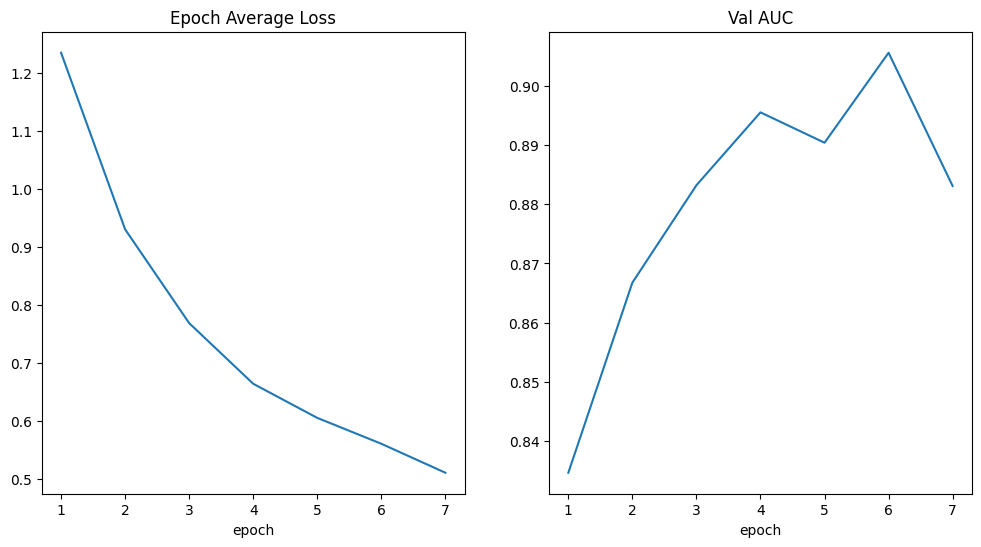

In [62]:
plt.figure("train", (12, 6))
plt.subplot(1, 2, 1)
plt.title("Epoch Average Loss")
x = [i + 1 for i in range(len(epoch_loss_values))]
y = epoch_loss_values
plt.xlabel("epoch")
plt.plot(x, y)
plt.subplot(1, 2, 2)
plt.title("Val AUC")
x = [val_interval * (i + 1) for i in range(len(metric_values))]
y = metric_values
plt.xlabel("epoch")
plt.plot(x, y)
plt.show()

In [63]:
transforms_test = transforms.Compose(
    [
        open_image,
        transform_PIL_to_cv2,
        transform_cv2_to_PIL,
        transforms.Resize(size=(256, 256)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485], std=[0.229])
    ]
)

In [64]:
test_dataset = Dataset(images_test, label_test, transforms_test)

test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=128, shuffle=False)

In [65]:
from sklearn.metrics import classification_report
model.load_state_dict(torch.load(os.path.join(root_dir, "best_metric_model.pth")))
model.eval()
y_true = []
y_pred = []
labelsforknown = {
        'no_tumor',
        'pituitary_tumor',
        'meningioma_tumor',
        'glioma_tumor'
    }
with torch.no_grad():
    for test_data in test_loader:
        test_images, test_labels = (
            test_data[0].to(Device),
            test_data[1].to(Device),
        )
        pred = model(test_images).argmax(dim=1)
        for i in range(len(pred)):
            y_true.append(test_labels[i].item())
            y_pred.append(pred[i].item())
print(classification_report(y_true, y_pred, target_names=labelsforknown, digits=4))

/tmp/ipykernel_10809/1472524629.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(os.path.join(root_dir, "best_metric_model.pth")))


                  precision    recall  f1-score   support

    glioma_tumor     0.2613    0.4952    0.3421       105
meningioma_tumor     0.5882    0.2703    0.3704        74
        no_tumor     0.4419    0.3304    0.3781       115
 pituitary_tumor     0.2533    0.1900    0.2171       100

        accuracy                         0.3274       394
       macro avg     0.3862    0.3215    0.3269       394
    weighted avg     0.3734    0.3274    0.3262       394

